# Setup environment

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import copy
import pathlib

from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split

try:
    import lightgbm as lgb
except:
    print("lightgbm is not installed")

DATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"
STATION_IDS = [211, 212, 213, 214, 215, 216]

BASE_FEATURE_COLS = [
    "NO2_quantrac",
    "PM25_quantrac",
    "O3_quantrac",
    "CO_quantrac",
    "Temperature_quantrac",
    "Humid_quantrac",
]

# Define lag and rolling windows for feature engineering
LAG_STEPS = [3, 6, 12, 24]
ROLL_WINDOWS = [3, 6, 12, 24]

# Define horizon (= n_past = n_future)
HORIZONS = [1, 24, 48, 72]

RANDOM_STATE = 42

# Directory to save the results and meta data
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")
    f.write(f"RANDOM_STATE: {RANDOM_STATE}\n")

/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/2025_12_11-12_32_22


# Load dataset

In [2]:
def load_station_csv(station_id, data_dir=DATA_DIR):
    csv_path = os.path.join(data_dir, f"{station_id}.csv")
    df = pd.read_csv(csv_path)

    # Convert to datetime
    df["date"] = pd.to_datetime(df["date"])
    df = df.sort_values("date").reset_index(drop=True)

    # Remove unncessary column
    if "Unnamed: 0" in df.columns:
        df = df.drop(columns=["Unnamed: 0"])

    # Add station_id column
    df["station_id"] = station_id
    return df

# Load dataset
dfs = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, DATA_DIR)
    dfs.append(df_sid)
df_all = pd.concat(dfs, ignore_index=True)

# Sort data by station then date
df_all = df_all.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_all = df_all.loc[:, ["date"] + BASE_FEATURE_COLS + ["station_id"]]

print(df_all.shape)
print(df_all.columns)
df_all

(92966, 8)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.740762,15.604762,55.431381,90.000000,28.361905,63.188095,211
1,2021-02-23 22:00:00,112.366471,14.594118,58.197176,1200.603529,28.320588,63.773529,211
2,2021-02-23 23:00:00,112.700433,13.436667,55.029433,1177.897000,28.336667,64.205000,211
3,2021-02-24 00:00:00,112.480867,12.365000,54.767700,90.000000,28.305000,64.735000,211
4,2021-02-24 01:00:00,114.331500,11.636667,53.786200,90.000000,28.300000,65.188333,211
...,...,...,...,...,...,...,...,...
92961,2022-12-31 19:00:00,0.088233,41.450000,75.916667,2.087167,27.690000,67.290000,216
92962,2022-12-31 20:00:00,0.083217,50.530000,66.116667,2.006500,27.401667,68.026667,216
92963,2022-12-31 21:00:00,0.084300,55.055000,55.133333,2.418833,27.603333,66.965000,216
92964,2022-12-31 22:00:00,0.066650,26.078333,46.750000,1.481500,27.036667,63.361667,216


In [3]:
df_all.isnull().sum()

date                        0
NO2_quantrac            43684
PM25_quantrac           43043
O3_quantrac             47797
CO_quantrac             43760
Temperature_quantrac    52890
Humid_quantrac          52890
station_id                  0
dtype: int64

# Data preparation

## Drop missing

Output: df_dropped

In [4]:
df_dropped_na = df_all.dropna().reset_index(drop=True)
display(df_dropped_na)

# Try dropping zero, but not good
#df_dropped_zero = df_dropped_na.loc[~(df_dropped_na == 0.0).any(axis=1)]
#display(df_dropped_zero)
#df_dropped = df_dropped_zero.reset_index(drop=True)

df_dropped = df_dropped_na.reset_index(drop=True)
df_dropped

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.740762,15.604762,55.431381,90.000000,28.361905,63.188095,211
1,2021-02-23 22:00:00,112.366471,14.594118,58.197176,1200.603529,28.320588,63.773529,211
2,2021-02-23 23:00:00,112.700433,13.436667,55.029433,1177.897000,28.336667,64.205000,211
3,2021-02-24 00:00:00,112.480867,12.365000,54.767700,90.000000,28.305000,64.735000,211
4,2021-02-24 01:00:00,114.331500,11.636667,53.786200,90.000000,28.300000,65.188333,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,0.088233,41.450000,75.916667,2.087167,27.690000,67.290000,216
38705,2022-12-31 20:00:00,0.083217,50.530000,66.116667,2.006500,27.401667,68.026667,216
38706,2022-12-31 21:00:00,0.084300,55.055000,55.133333,2.418833,27.603333,66.965000,216
38707,2022-12-31 22:00:00,0.066650,26.078333,46.750000,1.481500,27.036667,63.361667,216


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.740762,15.604762,55.431381,90.000000,28.361905,63.188095,211
1,2021-02-23 22:00:00,112.366471,14.594118,58.197176,1200.603529,28.320588,63.773529,211
2,2021-02-23 23:00:00,112.700433,13.436667,55.029433,1177.897000,28.336667,64.205000,211
3,2021-02-24 00:00:00,112.480867,12.365000,54.767700,90.000000,28.305000,64.735000,211
4,2021-02-24 01:00:00,114.331500,11.636667,53.786200,90.000000,28.300000,65.188333,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,0.088233,41.450000,75.916667,2.087167,27.690000,67.290000,216
38705,2022-12-31 20:00:00,0.083217,50.530000,66.116667,2.006500,27.401667,68.026667,216
38706,2022-12-31 21:00:00,0.084300,55.055000,55.133333,2.418833,27.603333,66.965000,216
38707,2022-12-31 22:00:00,0.066650,26.078333,46.750000,1.481500,27.036667,63.361667,216


## Visualization

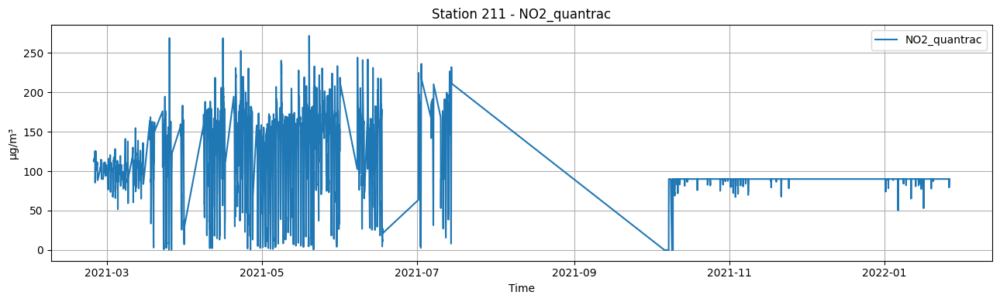

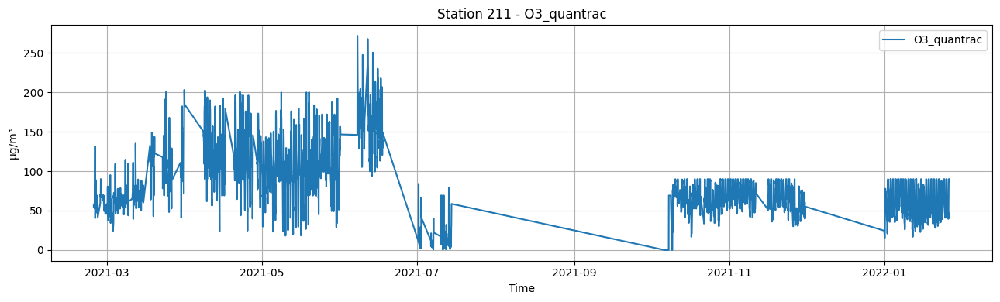

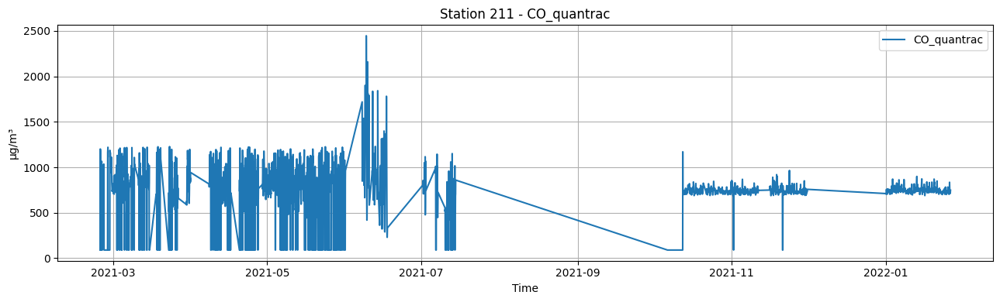

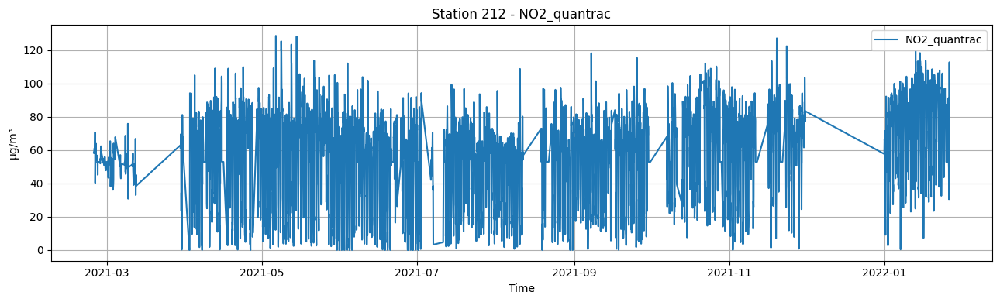

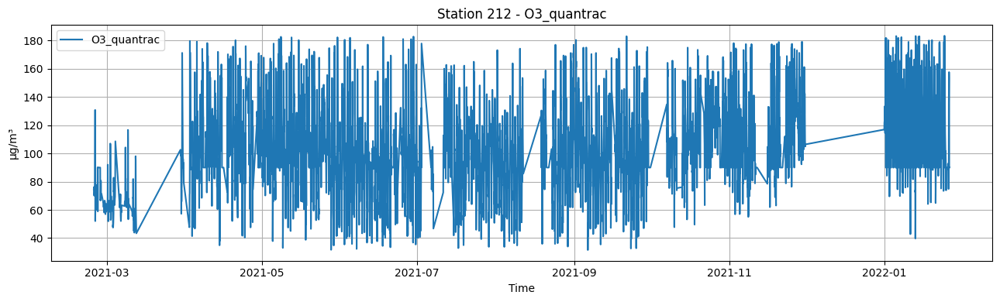

...

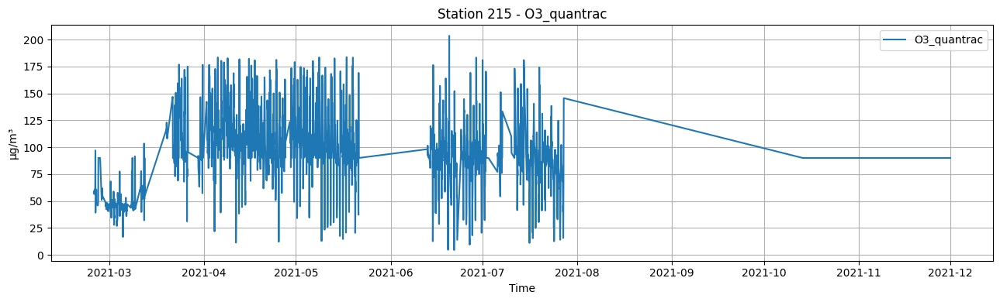

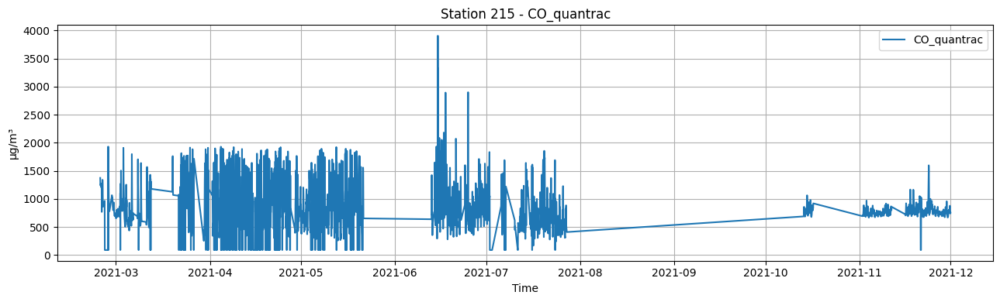

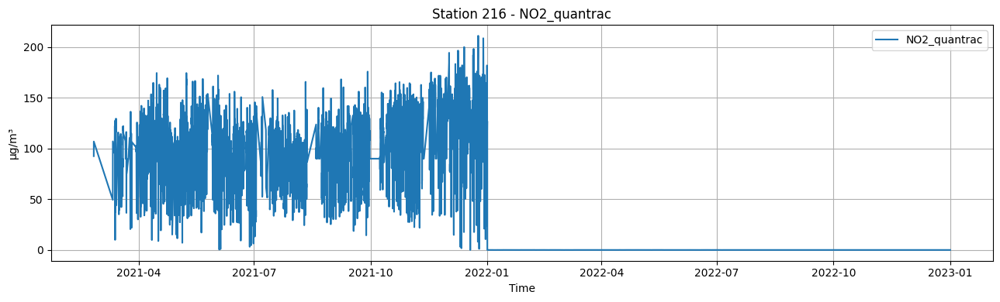

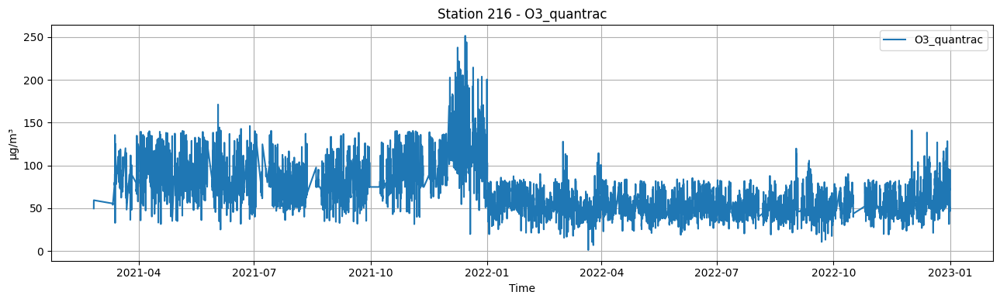

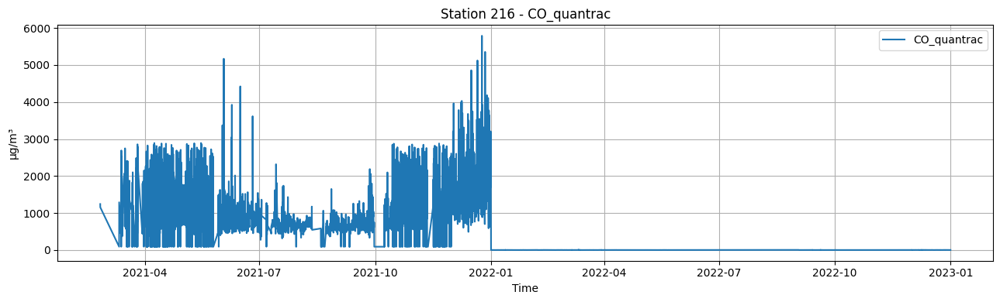

In [5]:
def plot_1_data(df, target_col, label, index, title, figsize=(13, 4)):
    plt.figure(figsize=figsize)
    plt.plot(index, df[target_col], label=label)
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("µg/m³")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, target_col, df_station["date"], f"Station {station} - {target_col}")
            #plot_1_data(df_station, target_col, target_col, df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Convert ppm to ug/m3

Apply only to station 216, year 2022 on NO2, CO columns

Output: df_converted

In [6]:
df_converted = copy.deepcopy(df_dropped)
mask = (df_converted["station_id"] == 216) & (df_converted["date"] >= "2022-01-01")
df_converted.loc[mask, "NO2_quantrac"] = df_converted.loc[mask, "NO2_quantrac"].apply(lambda x: x * 1883.2)
df_converted.loc[mask, "CO_quantrac"] = df_converted.loc[mask, "CO_quantrac"].apply(lambda x: x * 1146.8)
df_converted

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.740762,15.604762,55.431381,90.000000,28.361905,63.188095,211
1,2021-02-23 22:00:00,112.366471,14.594118,58.197176,1200.603529,28.320588,63.773529,211
2,2021-02-23 23:00:00,112.700433,13.436667,55.029433,1177.897000,28.336667,64.205000,211
3,2021-02-24 00:00:00,112.480867,12.365000,54.767700,90.000000,28.305000,64.735000,211
4,2021-02-24 01:00:00,114.331500,11.636667,53.786200,90.000000,28.300000,65.188333,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,166.161013,41.450000,75.916667,2393.562733,27.690000,67.290000,216
38705,2022-12-31 20:00:00,156.713627,50.530000,66.116667,2301.054200,27.401667,68.026667,216
38706,2022-12-31 21:00:00,158.753760,55.055000,55.133333,2773.918067,27.603333,66.965000,216
38707,2022-12-31 22:00:00,125.515280,26.078333,46.750000,1698.984200,27.036667,63.361667,216


## Visualization after converting unit

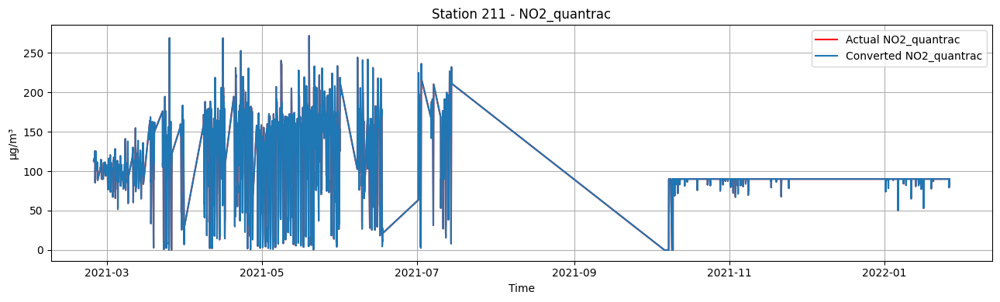

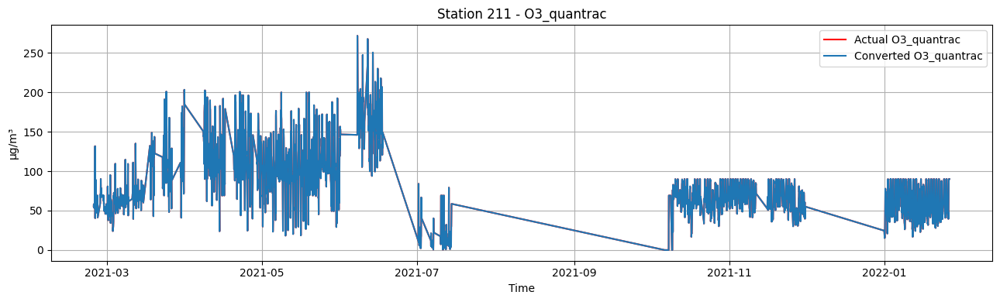

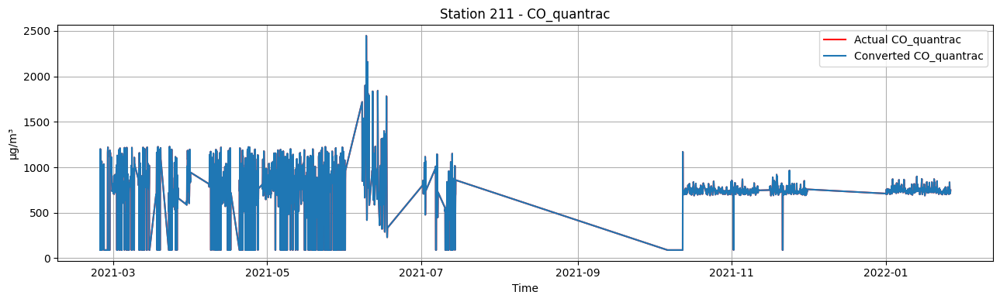

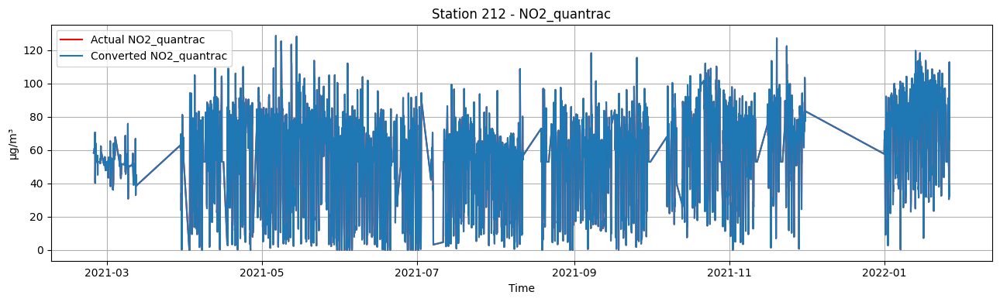

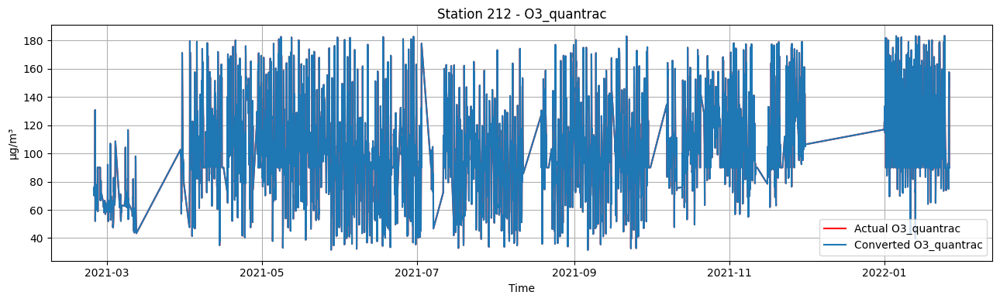

...

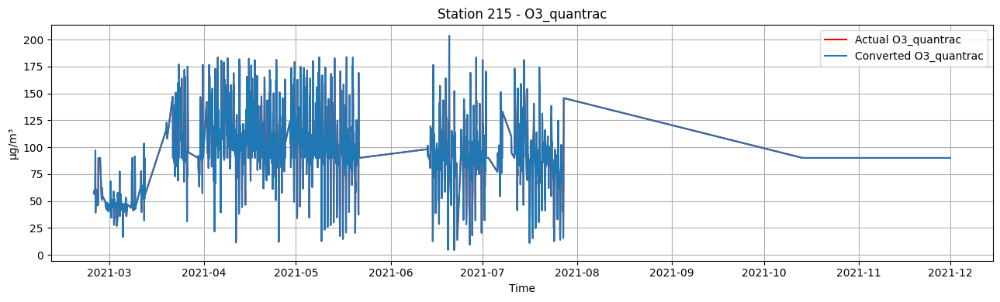

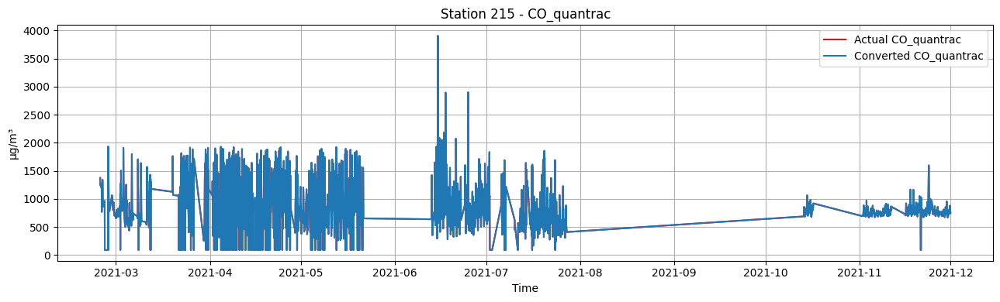

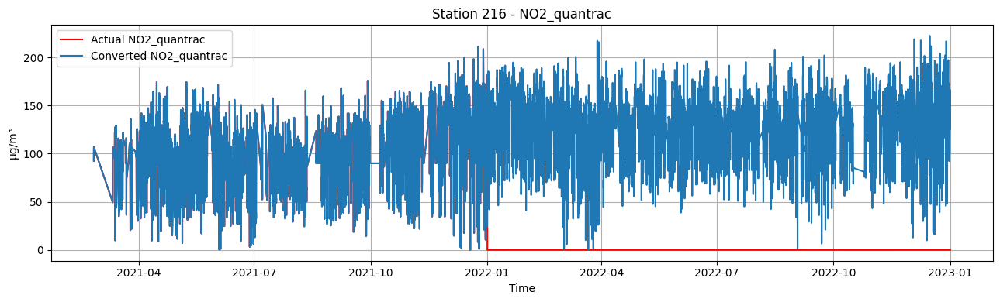

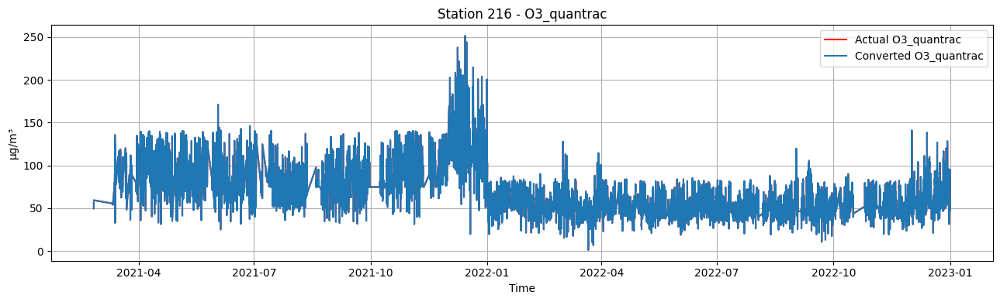

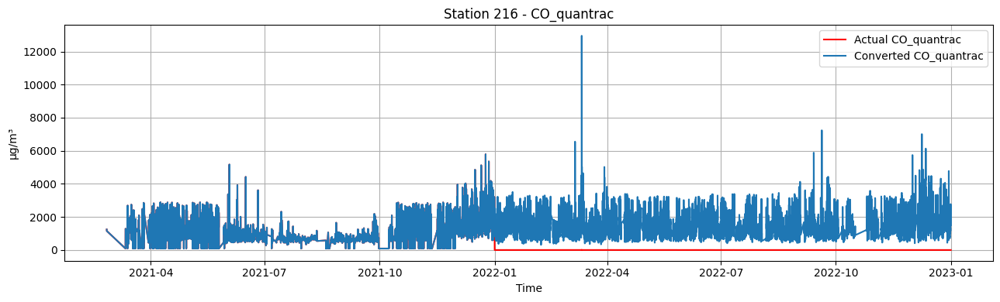

In [7]:
def plot_2_data(df1, target_col1, label1, df2, target_col2, label2, index, title, figsize=(13, 4)):
    plt.figure(figsize=figsize)
    plt.plot(index, df1[target_col1], label=label1, color="r")
    plt.plot(index, df2[target_col2], label=label2)
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("µg/m³")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    df_station_converted = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_2_data(df_station, target_col, f"Actual {target_col}",
                        df_station_converted, target_col, f"Converted {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Ugly hack to remove outliers

In [8]:
test = copy.deepcopy(df_converted)

lenbefore = len(test)
print(f"Before: {lenbefore} records")

# 212 CO quantrac
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["CO_quantrac"] > 4000].index)

# 213 CO quantrac
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["CO_quantrac"] > 4000].index)

# 214 CO quantrac
test214 = test[test["station_id"] == 214]
test = test.drop(index=test214[test214["CO_quantrac"] > 4000].index)

# 215 NO2 quantrac
# 215 CO quantrac
test215 = test[test["station_id"] == 215]
test = test.drop(index=test215[test215["NO2_quantrac"] > 140].index)
test = test.drop(index=test215[test215["CO_quantrac"] > 2500].index)

# 216 CO quantrac
test216 = test[test["station_id"] == 216]
test = test.drop(index=test216[test216["CO_quantrac"] > 10000].index)

lenafter = len(test)
print(f"After: {lenafter} records")
print(f"Removed {lenbefore - lenafter} records")

df_converted = test.reset_index(drop=True)

Before: 38709 records
After: 38692 records
Removed 17 records


## Visualization after removing outliers

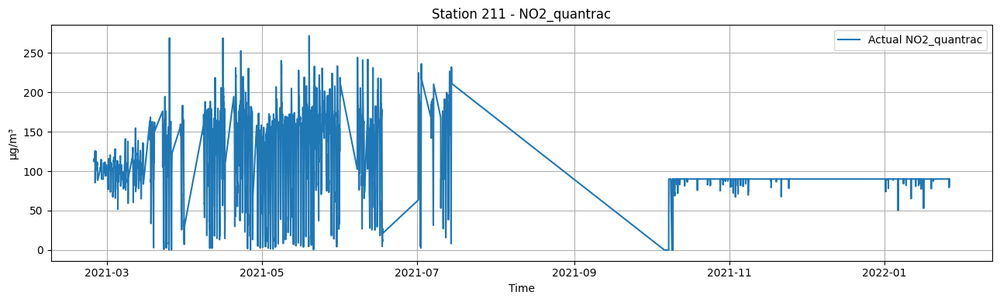

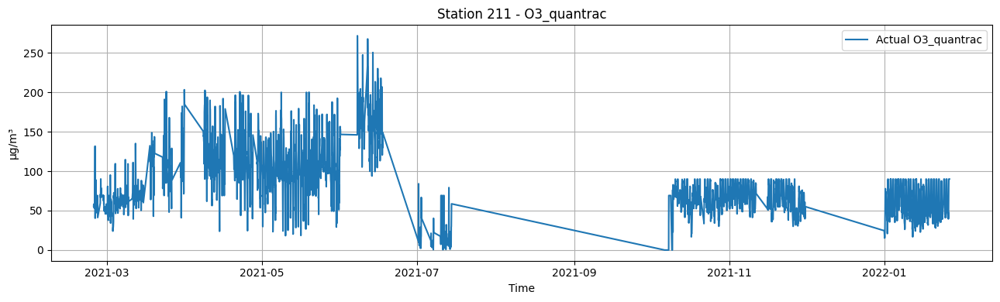

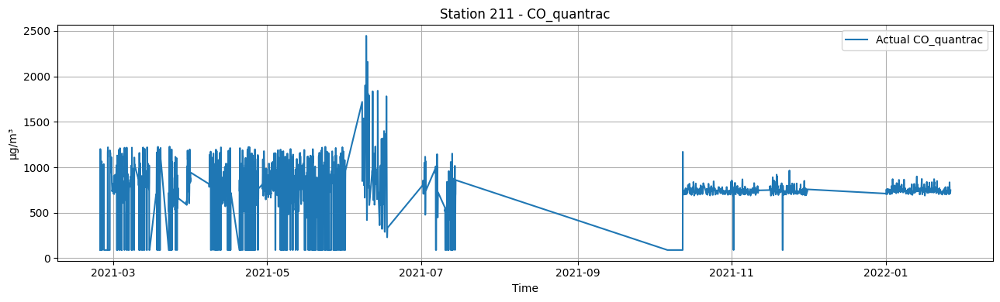

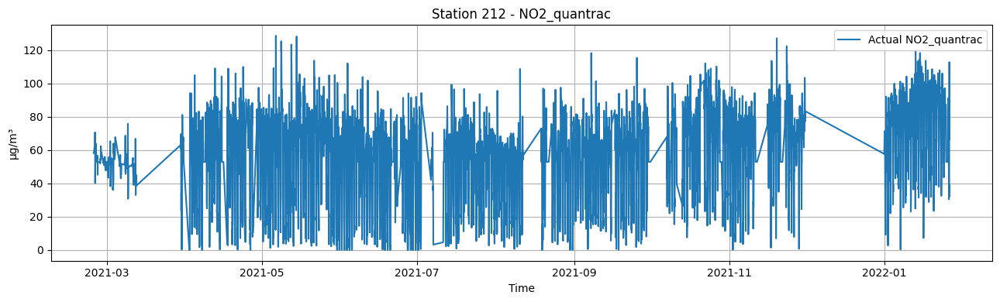

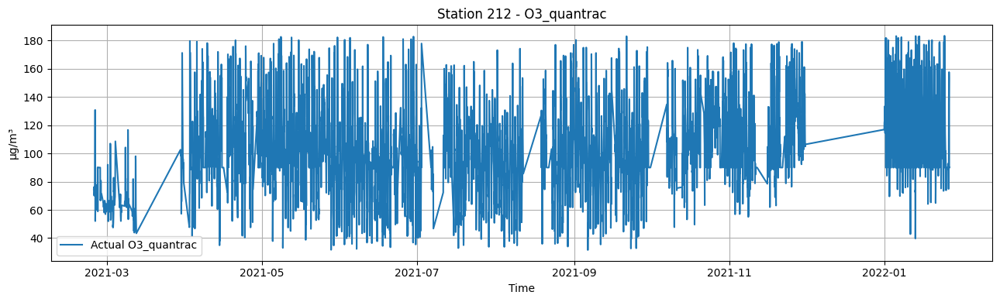

...

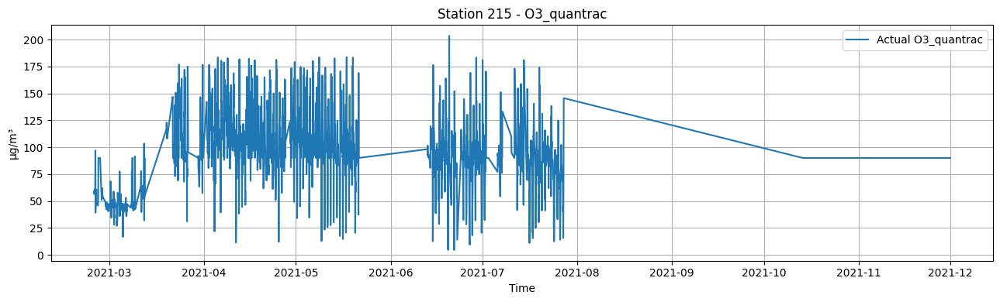

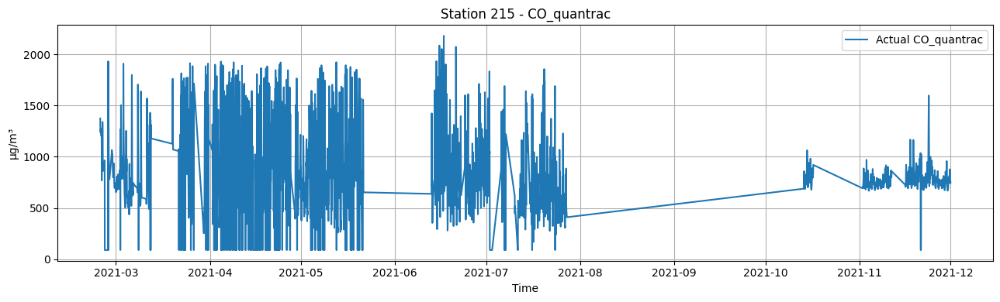

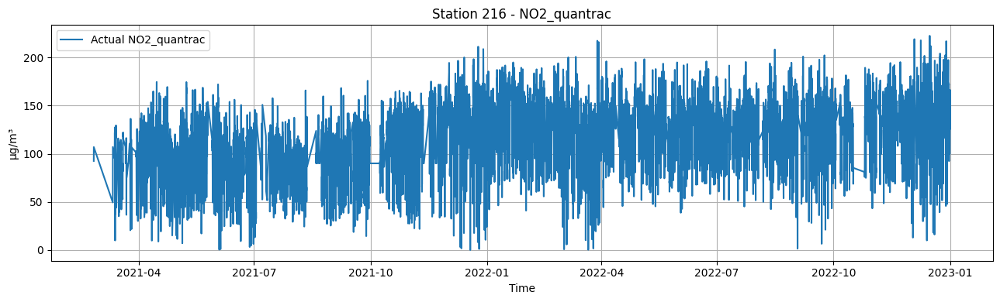

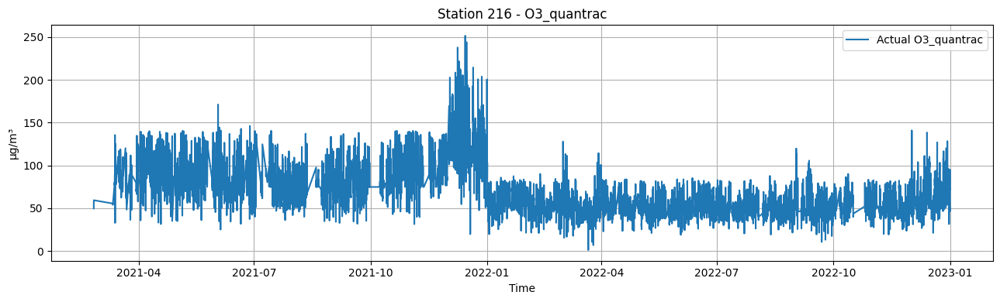

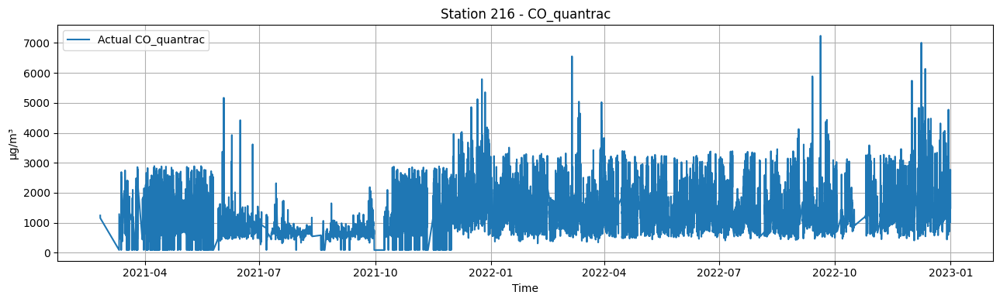

In [9]:
for station in STATION_IDS:
    df_station = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, f"Actual {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Feature engineering

In [10]:
def add_time_features(df, time_col="date"):
    df = df.copy()
    df["hour"] = df[time_col].dt.hour
    df["dayofweek"] = df[time_col].dt.dayofweek
    df["month"] = df[time_col].dt.month
    return df

# Add lag features for all FEATURES including LABEL
def add_lag_features(df, group_col, target_cols, lag_steps):
    df = df.copy()
    df = df.sort_values(["station_id", "date"])

    for col in target_cols:
        for lag in lag_steps:
            df[f"{col}_lag{lag}"] = df.groupby(group_col)[col].shift(lag)
    return df

# Just add the rolling features for LABEL
def add_rolling_features(df, group_col, target_cols, windows):
    assert isinstance(target_cols, list), "target_cols should be a list"

    df = df.copy()
    df = df.sort_values(["station_id", "date"])

    for col in target_cols:
        for w in windows:
            df[f"{col}_roll{w}_mean"] = (
                df.groupby(group_col)[col]
                  .shift(1) # use the past, avoid leaking
                  .rolling(window=w, min_periods=1)
                  .mean()
                  .reset_index(level=0, drop=True)
            )
            df[f"{col}_roll{w}_std"] = (
                df.groupby(group_col)[col]
                  .shift(1)
                  .rolling(window=w, min_periods=1)
                  .std()
                  .reset_index(level=0, drop=True)
            )
    return df

# Add time features and lag feature for all gases
dftestno2 = add_time_features(df_converted)
dftestno2 = add_lag_features(df_converted, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=[3, 6, 12, 24])
dftestno2 = add_rolling_features(df_converted, group_col="station_id", target_cols=["NO2_quantrac"], windows=[3, 6, 12, 24])
print(dftestno2.shape)
print(dftestno2.columns)
dftestno2

(38692, 16)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac_roll24_mean', 'NO2_quantrac_roll24_std'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2021-02-23 21:00:00,112.740762,15.604762,55.431381,90.000000,28.361905,63.188095,211,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-02-23 22:00:00,112.366471,14.594118,58.197176,1200.603529,28.320588,63.773529,211,112.740762,NaN,112.740762,NaN,112.740762,NaN,112.740762,NaN
2,2021-02-23 23:00:00,112.700433,13.436667,55.029433,1177.897000,28.336667,64.205000,211,112.553616,0.264664,112.553616,0.264664,112.553616,0.264664,112.553616,0.264664
3,2021-02-24 00:00:00,112.480867,12.365000,54.767700,90.000000,28.305000,64.735000,211,112.602555,0.205447,112.602555,0.205447,112.602555,0.205447,112.602555,0.205447
4,2021-02-24 01:00:00,114.331500,11.636667,53.786200,90.000000,28.300000,65.188333,211,112.515924,0.169719,112.572133,0.178441,112.572133,0.178441,112.572133,0.178441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.161013,41.450000,75.916667,2393.562733,27.690000,67.290000,216,147.203467,18.862212,127.011378,25.478626,130.924249,19.684872,137.227097,24.338989
38688,2022-12-31 20:00:00,156.713627,50.530000,66.116667,2301.054200,27.401667,68.026667,216,160.574187,6.599564,138.106564,25.643475,132.888531,21.995214,137.063625,24.120908
38689,2022-12-31 21:00:00,158.753760,55.055000,55.133333,2773.918067,27.603333,66.965000,216,161.714569,4.748040,146.183400,21.686363,133.950447,22.869141,136.383581,23.278021
38690,2022-12-31 22:00:00,125.515280,26.078333,46.750000,1698.984200,27.036667,63.361667,216,160.542800,4.971295,153.873133,14.338064,135.245147,23.859794,135.834314,22.546688


## Build supervised from time-series

In [11]:
# Reframe past future
def build_supervised_for_horizon(df, horizon_h, target_col):
    # Sort data by station_id then date
    df = df.copy()
    df = df.sort_values(["station_id", "date"])

    # Define target_name, which is the target_col plus horizon_h hour
    target_name = f"{target_col}_t_plus_{horizon_h}h"
    df[target_name] = df.groupby("station_id")[target_col].shift(-horizon_h)

    # Dropna after shifting
    df = df.dropna().reset_index(drop=True)

    # Define label, feature and meta columns
    label_cols = [target_name]
    meta_cols = ["date", "station_id"]
    feature_cols = [c for c in df.columns if c not in label_cols + meta_cols + [target_col]]

    # Get the X, y and meta data
    X = df[meta_cols + feature_cols]
    y = df[meta_cols + label_cols]

    return X, y

# Example
Xdummy, ydummy = build_supervised_for_horizon(dftestno2, horizon_h=72, target_col="NO2_quantrac")
print("Horizon 1h:", Xdummy.shape, ydummy.shape)
print(Xdummy.columns)
print(ydummy.columns)
display(Xdummy)
display(ydummy)

Horizon 1h: (38258, 15) (38258, 3)
Index(['date', 'station_id', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'NO2_quantrac_roll3_mean',
       'NO2_quantrac_roll3_std', 'NO2_quantrac_roll6_mean',
       'NO2_quantrac_roll6_std', 'NO2_quantrac_roll12_mean',
       'NO2_quantrac_roll12_std', 'NO2_quantrac_roll24_mean',
       'NO2_quantrac_roll24_std'],
      dtype='object')
Index(['date', 'station_id', 'NO2_quantrac_t_plus_72h'], dtype='object')


,date,station_id,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2021-02-23 23:00:00,211,13.436667,55.029433,1177.897000,28.336667,64.205000,112.553616,0.264664,112.553616,0.264664,112.553616,0.264664,112.553616,0.264664
1,2021-02-24 00:00:00,211,12.365000,54.767700,90.000000,28.305000,64.735000,112.602555,0.205447,112.602555,0.205447,112.602555,0.205447,112.602555,0.205447
2,2021-02-24 01:00:00,211,11.636667,53.786200,90.000000,28.300000,65.188333,112.515924,0.169719,112.572133,0.178441,112.572133,0.178441,112.572133,0.178441
3,2021-02-24 02:00:00,211,11.530000,55.814633,90.000000,28.253333,65.561667,113.170933,1.011058,112.924006,0.801845,112.924006,0.801845,112.924006,0.801845
4,2021-02-24 03:00:00,211,11.241667,54.800417,90.000000,28.216667,65.925000,114.268767,1.757373,113.435661,1.443990,113.435661,1.443990,113.435661,1.443990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38253,2022-12-28 19:00:00,216,32.163333,89.283333,2518.755067,29.625000,58.043333,159.214098,20.857906,114.184693,53.684851,127.581569,55.785534,151.632738,46.865551
38254,2022-12-28 20:00:00,216,37.030000,116.950000,2530.796467,28.140000,71.948333,173.348560,6.878694,136.280907,46.722462,128.130836,56.290097,152.433098,47.162243
38255,2022-12-28 21:00:00,216,40.385000,120.166667,1990.080267,27.395000,75.831667,190.454293,22.857511,156.169591,52.005798,130.066347,59.075982,154.560852,48.908902
38256,2022-12-28 22:00:00,216,38.216667,105.000000,1664.389067,26.738333,79.206667,202.496311,21.040829,180.855204,30.217751,132.569433,62.051474,155.969329,50.101296


,date,station_id,NO2_quantrac_t_plus_72h
0,2021-02-23 23:00:00,211,105.341135
1,2021-02-24 00:00:00,211,98.306824
2,2021-02-24 01:00:00,211,100.530167
3,2021-02-24 02:00:00,211,101.188867
4,2021-02-24 03:00:00,211,102.945400
...,...,...,...
38253,2022-12-28 19:00:00,216,166.161013
38254,2022-12-28 20:00:00,216,156.713627
38255,2022-12-28 21:00:00,216,158.753760
38256,2022-12-28 22:00:00,216,125.515280


## Split train/validation/test for each station

In [12]:
def train_test_validation_split(X, y, train_ratio=0.7, val_ratio=0.15):
    assert (X["date"].equals(y["date"]) and X["station_id"].equals(y["station_id"])), "X and y should have the same metadata values"

    X_train, y_train, X_val, y_val, X_test, y_test = [], [], [], [], [], []
    meta_train, meta_val, meta_test = [], [], []

    meta_cols = ["date", "station_id"]
    
    for station in list(sorted(X["station_id"].unique())):
        X_station = X[X["station_id"] == station]
        y_station = y[y["station_id"] == station]
        meta = X_station[meta_cols]

        X_station = X_station.drop(columns=meta_cols)
        y_station = y_station.drop(columns=meta_cols)
    
        n = len(X_station)
        train_end = int(n * train_ratio)
        val_end = int(n * (train_ratio + val_ratio))
    
        X_train.append(X_station.iloc[:train_end])
        y_train.append(y_station.iloc[:train_end])
        meta_train.append(meta.iloc[:train_end])
    
        X_val.append(X_station.iloc[train_end:val_end])
        y_val.append(y_station.iloc[train_end:val_end])
        meta_val.append(meta.iloc[train_end:val_end])
    
        X_test.append(X_station.iloc[val_end:])
        y_test.append(y_station.iloc[val_end:])
        meta_test.append(meta.iloc[val_end:])

    X_train = pd.concat(X_train, axis=0)
    X_val = pd.concat(X_val, axis=0)
    X_test = pd.concat(X_test, axis=0)
    
    y_train = pd.concat(y_train, axis=0)
    y_val = pd.concat(y_val, axis=0)
    y_test = pd.concat(y_test, axis=0)
    
    meta_train = pd.concat(meta_train, axis=0)
    meta_val = pd.concat(meta_val, axis=0)
    meta_test = pd.concat(meta_test, axis=0)

    return (X_train, y_train, meta_train, X_val, y_val, meta_val, X_test, y_test, meta_test)

# Example
(X_train_dummy, y_train_dummy, meta_train_dummy,
 X_val_dummy, y_val_dummy, meta_val_dummy,
 X_test_dummy, y_test_dummy, meta_test_dummy) = train_test_validation_split(Xdummy, ydummy)
display(X_test_dummy)

,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
3287,13.133333,75.250430,702.803600,30.283333,70.961667,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
3288,13.983333,67.026909,707.368500,29.095000,75.575000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
3289,18.483333,62.043188,722.935000,27.650000,85.500000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
3290,22.583333,67.859831,742.837200,27.825000,86.958333,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
3291,24.950000,70.576204,768.985100,27.863333,86.801667,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
38253,32.163333,89.283333,2518.755067,29.625000,58.043333,159.214098,20.857906,114.184693,53.684851,127.581569,55.785534,151.632738,46.865551
38254,37.030000,116.950000,2530.796467,28.140000,71.948333,173.348560,6.878694,136.280907,46.722462,128.130836,56.290097,152.433098,47.162243
38255,40.385000,120.166667,1990.080267,27.395000,75.831667,190.454293,22.857511,156.169591,52.005798,130.066347,59.075982,154.560852,48.908902
38256,38.216667,105.000000,1664.389067,26.738333,79.206667,202.496311,21.040829,180.855204,30.217751,132.569433,62.051474,155.969329,50.101296


## Apply IQR on test set only

In [13]:
# Return the index of outliers, using IQR
# This function will filter for each station
# Assuming that the index is applied for all stations
def get_outliers_indices(df, meta, target_col):
    combined_df = pd.concat((meta, df), axis=1)
    invalid_indices = []
    for station in combined_df["station_id"].unique():
        print(f"Station: {station}")
        df_station = combined_df[combined_df["station_id"] == station]

        Q3 = np.quantile(df_station[target_col], 0.75)
        Q1 = np.quantile(df_station[target_col], 0.25)
        IQR = Q3 - Q1
        print(f"IQR value for column {target_col} is: {IQR}")
    
        lower_range = Q1 - 1.5 * IQR
        upper_range = Q3 + 1.5 * IQR
        print(f"lower_range = {lower_range}, upper_range = {upper_range}")

        invalid_records = df_station[(df_station[target_col] < lower_range) | (df_station[target_col] > upper_range)]
        invalid_indices += list(invalid_records.index)
    return list(invalid_indices)

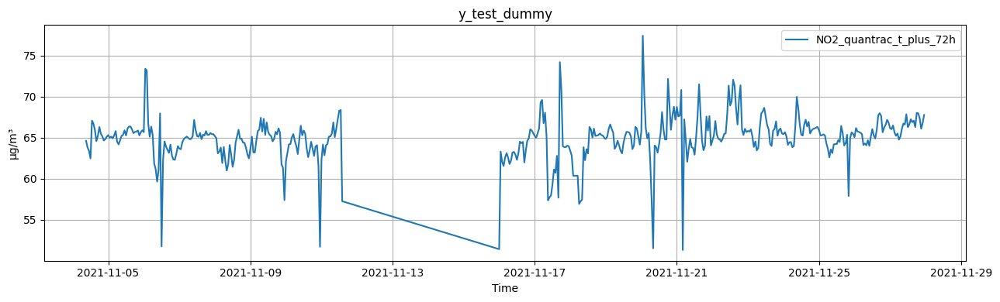

Station: 211
IQR value for column NO2_quantrac_t_plus_72h is: 0.0
lower_range = 90.0, upper_range = 90.0
Station: 212
IQR value for column NO2_quantrac_t_plus_72h is: 36.10303333000002
lower_range = 0.9096333399999708, upper_range = 145.32176666000004
Station: 213
IQR value for column NO2_quantrac_t_plus_72h is: 52.735478737499996
lower_range = -48.68539310625, upper_range = 162.25652184375
Station: 214
IQR value for column NO2_quantrac_t_plus_72h is: 36.6431761075
lower_range = -1.688480826249993, upper_range = 144.88422360375
Station: 215
IQR value for column NO2_quantrac_t_plus_72h is: 2.1044536944153904
lower_range = 60.78207414929594, upper_range = 69.1998889269575
Station: 216
IQR value for column NO2_quantrac_t_plus_72h is: 32.47988022598872
lower_range = 72.99514610169479, upper_range = 202.91466700564968
removed_indices = [3287, 3289, 3290, 3335, 3382, 3383, 3431, 3433, 3434, 3456, 3457, 3458, 3504, 3505, 3506, 3548, 3575, 3576, 3578, 3579, 3600, 3601, 3602, 3621, 3622, 3623, 

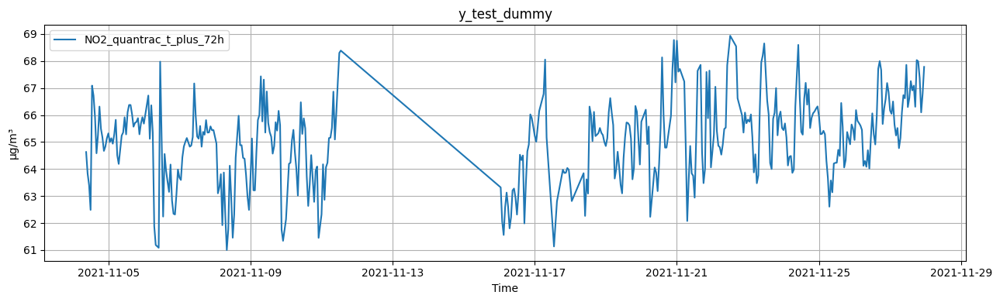

In [14]:
meta215 = meta_test_dummy[meta_test_dummy["station_id"] == 215]
test215 = y_test_dummy.loc[meta215.index]
plot_1_data(test215, "NO2_quantrac_t_plus_72h", "NO2_quantrac_t_plus_72h", meta215["date"], "y_test_dummy")

removed_indices = get_outliers_indices(y_test_dummy, meta_test_dummy, "NO2_quantrac_t_plus_72h")
print(f"removed_indices = {removed_indices}")

y_test_dummy_removed = y_test_dummy.drop(index=removed_indices)
X_test_dummy_removed = X_test_dummy.drop(index=removed_indices)
meta_test_dummy_removed = meta_test_dummy.drop(index=removed_indices)

meta215_removed = meta_test_dummy_removed[meta_test_dummy_removed["station_id"] == 215]
test215_removed = y_test_dummy_removed.loc[meta215_removed.index]
plot_1_data(test215_removed, "NO2_quantrac_t_plus_72h", "NO2_quantrac_t_plus_72h", meta215_removed["date"], "y_test_dummy")
#plot_1_data(test215_removed, "NO2_quantrac_t_plus_72h", "NO2_quantrac_t_plus_72h", test215_removed.index, "y_test_dummy")

## Metrics

In [15]:
def compute_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)

    # Mean Bias Error
    mbe = np.mean(y_pred - y_true)

    # MNBE
    yt_nonzero = np.where(y_true == 0, np.nan, y_true)
    mnbe = np.nanmean((y_pred - yt_nonzero) / yt_nonzero) * 100.0

    # Pearson r (with standard deviation check)
    if np.std(y_true) < 1e-6 or np.std(y_pred) < 1e-6:
        r = np.nan
    else:
        r = np.corrcoef(y_true.T, y_pred.T)[0, 1]

    return {
        "RMSE": rmse,
        "MAE": mae,
        "MBE": mbe,
        "MNBE": mnbe,
        "r": r,
        "n_samples": len(y_true),
    }

# LightGBM model

## Define model

In [16]:
def train_lgbm_for_horizon(df_feat,
                           horizon_h,
                           target_col,
                           learning_rate=0.05,
                           n_estimators=2000,
                           early_stopping_rounds=100):

    # Build supervised dataset
    X, y = build_supervised_for_horizon(df_feat, horizon_h=horizon_h, target_col=target_col)

    # Split train validation test
    (X_train, y_train, meta_train, X_val, y_val, meta_val, X_test, y_test, meta_test) = train_test_validation_split(X, y)

    # Remove outliers for test data
    #removed_indices = get_outliers_indices(y_test, meta_test, f"{target_col}_t_plus_{horizon_h}h")
    #print(f"Removed indices: {removed_indices}")
    #X_test = X_test.drop(index=removed_indices)
    #y_test = y_test.drop(index=removed_indices)
    #meta_test = meta_test.drop(index=removed_indices)

    # Dataset cho LightGBM
    lgb_train = lgb.Dataset(X_train, label=y_train)
    lgb_val = lgb.Dataset(X_val, label=y_val, reference=lgb_train)

    params = {
        "objective": "regression",
        "metric": "rmse",
        "learning_rate": learning_rate,
        "num_leaves": 63,
        "feature_fraction": 0.9,
        "bagging_fraction": 0.8,
        "bagging_freq": 1,
        "verbosity": -1,
        "device": "cuda",
        "seed": RANDOM_STATE,
    }

    # Early stopping dùng callback (tương thích nhiều version LightGBM)
    callbacks = [
        lgb.early_stopping(stopping_rounds=early_stopping_rounds),
        lgb.log_evaluation(period=100),
    ]
    model = lgb.train(
        params,
        lgb_train,
        num_boost_round=n_estimators,
        valid_sets=[lgb_train, lgb_val],
        valid_names=["train", "val"],
        callbacks=callbacks,
    )

    # Prediction
    y_pred = np.expand_dims(model.predict(X_test, num_iteration=model.best_iteration), axis=-1)
    metrics_overall = compute_metrics(y_test, y_pred)

    # Metrics for each station
    df_test_res = meta_test.copy()
    df_test_res["y_true"] = y_test.values
    df_test_res["y_pred"] = y_pred

    rows = []
    for sid, grp in df_test_res.groupby("station_id"):
        m = compute_metrics(grp["y_true"], grp["y_pred"])
        rows.append({"station": int(sid), "horizon_h": horizon_h,**m})
    metrics_by_station = pd.DataFrame(rows)

    return model, metrics_overall, metrics_by_station, (
        X_train, y_train, X_val, y_val, X_test, y_test, meta_test
    )

## Reference

In [17]:
def plot_timeseries_example(df, model, horizon_h, station_id, target_col, n_points=300):
    # Prepare data for reference
    X, y = build_supervised_for_horizon(df, horizon_h, target_col)
    (_, _, _,
     _, _, _,
     X_test, y_test, meta_test) = train_test_validation_split(X, y)

    # Remove outliers for test data
    #removed_indices = get_outliers_indices(y_test, meta_test, f"{target_col}_t_plus_{horizon_h}h")
    #print(f"Removed indices: {removed_indices}")
    #X_test = X_test.drop(index=removed_indices)
    #y_test = y_test.drop(index=removed_indices)
    #meta_test = meta_test.drop(index=removed_indices)

    # Get the data of station
    mask = (meta_test["station_id"] == station_id)
    X_test_sid = X_test[mask]
    y_test_sid = y_test[mask]
    meta_sid = meta_test[mask]
    if len(X_test_sid) == 0:
        print(f"No test sample for station {station_id}")
        return
    
    # Prediction
    y_pred_sid = model.predict(X_test_sid, num_iteration=getattr(model, "best_iteration", None))

    # Plotting
    X_plot = meta_sid.iloc[-n_points:]
    y_true_plot = y_test_sid.iloc[-n_points:]
    y_pred_plot = y_pred_sid[-n_points:]

    plt.figure(figsize=(14, 5))
    #plt.plot(X_plot["date"], y_true_plot, label=f"Actual {target_col}", linewidth=1.5)
    #plt.plot(X_plot["date"], y_pred_plot, label=f"Predicted {target_col} (LightGBM)", linestyle="--")
    plt.plot(X_plot.index, y_true_plot, label=f"Actual {target_col}", linewidth=1.5)
    plt.plot(X_plot.index, y_pred_plot, label=f"Predicted {target_col} (LightGBM)", linestyle="--")
    plt.title(f"Station {station_id} - Horizon {horizon_h}h")
    plt.xlabel("Time")
    plt.ylabel(f"{target_col} (µg/m³)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(LIGHTGBM_DIR, f"{target_col}_lightgbm_{horizon_h}h_{station_id}_{n_points}.png"))
    plt.show()

## Add time and lags features

In [18]:
# Add time features and lag feature for all gases
df_time_feats = add_time_features(df_converted)
df_lag_feats = add_lag_features(df_time_feats, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)

## Training for NO2

In [19]:
label = "NO2_quantrac"

# Add rolling features for LABEL
df_no2 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

print(df_no2.columns)

# Start running model
no2_all_metrics = []
no2_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)
    no2_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    no2_all_metrics.append(metrics_by_station)

# Metrics table
no2_df_metrics_all = pd.concat(no2_all_metrics, ignore_index=True)
no2_df_metrics_all = no2_df_metrics_all.sort_values(["station", "horizon_h"]).reset_index(drop=True)
no2_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"))
no2_df_metrics_all

Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id', 'hour',
       'dayofweek', 'month', 'NO2_quantrac_lag3', 'NO2_quantrac_lag6',
       'NO2_quantrac_lag12', 'NO2_quantrac_lag24', 'PM25_quantrac_lag3',
       'PM25_quantrac_lag6', 'PM25_quantrac_lag12', 'PM25_quantrac_lag24',
       'O3_quantrac_lag3', 'O3_quantrac_lag6', 'O3_quantrac_lag12',
       'O3_quantrac_lag24', 'CO_quantrac_lag3', 'CO_quantrac_lag6',
       'CO_quantrac_lag12', 'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac_roll24_mean

,station,horizon_h,RMSE,MAE,MBE,MNBE,r,n_samples
0,211,1,6.699716,4.930504,-0.148034,-0.117801,0.401856,588
1,211,24,6.447988,5.370184,2.024958,2.397837,0.244631,585
2,211,48,5.543861,4.196812,0.705024,0.954891,0.180865,581
3,211,72,4.681099,3.374468,0.414428,0.619818,0.238214,577
4,212,1,13.140549,9.884981,-1.366481,17.376877,0.842909,875
5,212,24,16.372037,12.876530,-5.029373,18.528534,0.748286,871
6,212,48,17.780668,14.239718,-4.412147,24.221381,0.673023,867
7,212,72,20.495005,16.887499,-6.953679,25.201537,0.563803,864
8,213,1,18.356237,14.483426,0.846616,194.672438,0.827057,887
9,213,24,23.102704,18.117578,1.318394,234.649021,0.705180,884


station_id = 211
hour = 1


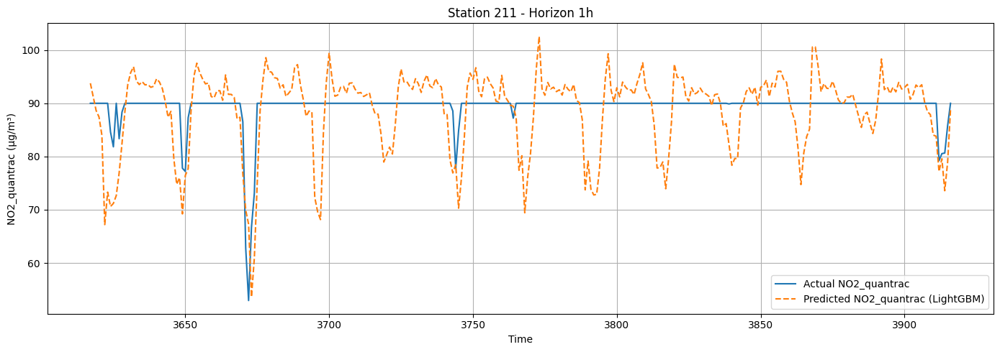

hour = 24


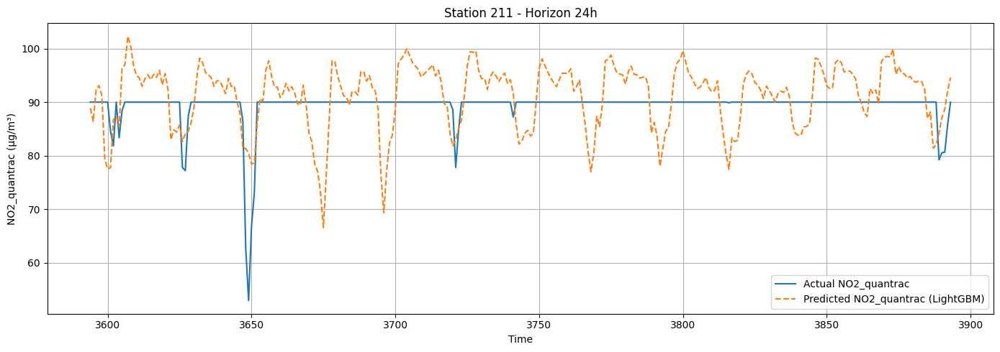

hour = 48


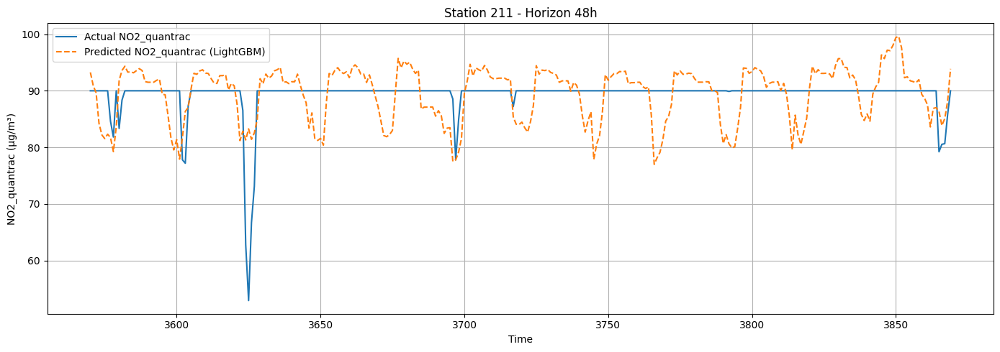

hour = 72


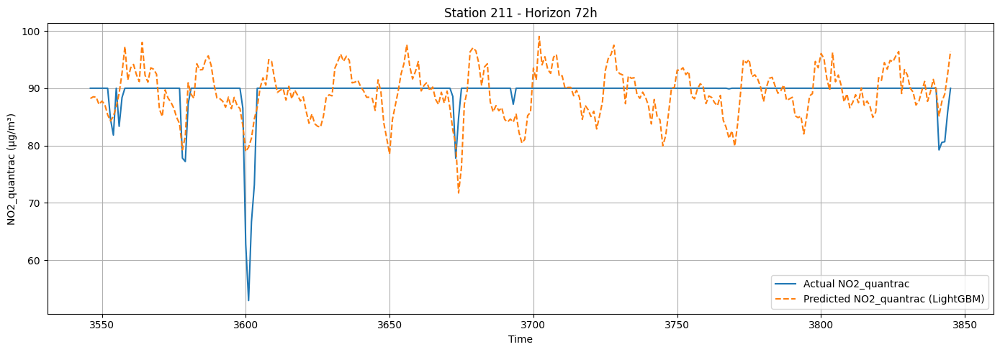

station_id = 212
hour = 1


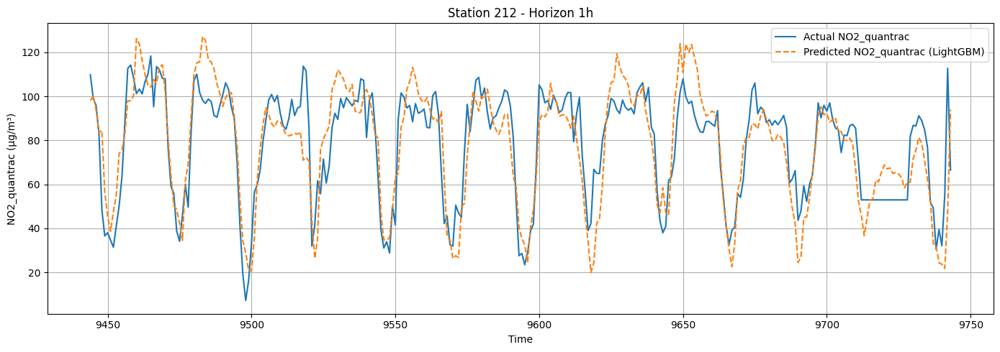

hour = 24


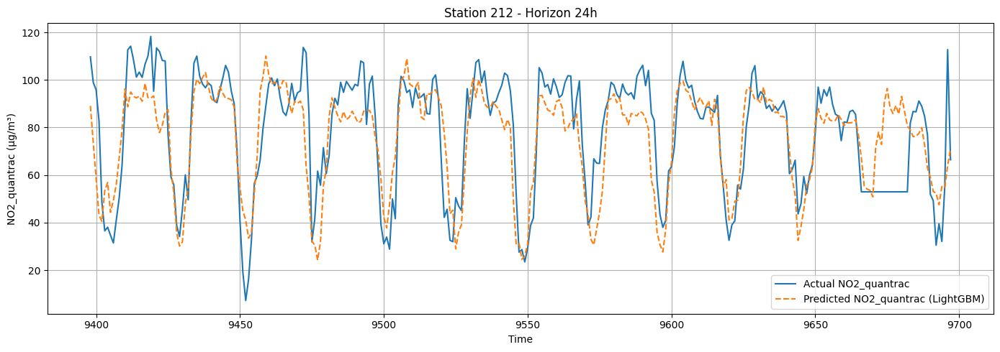

hour = 48


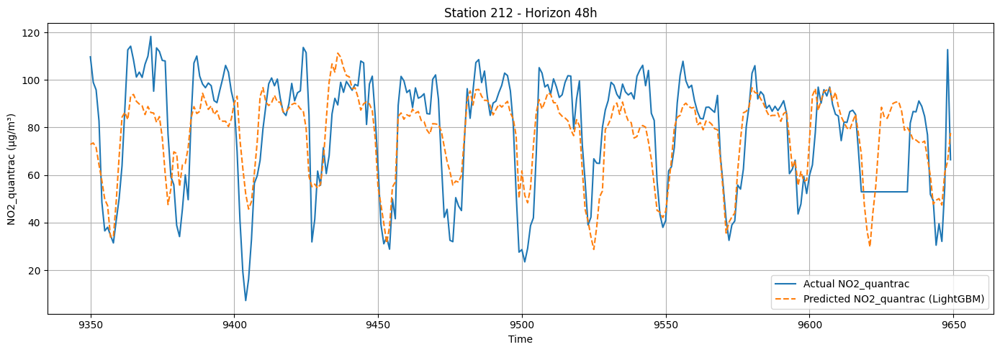

hour = 72


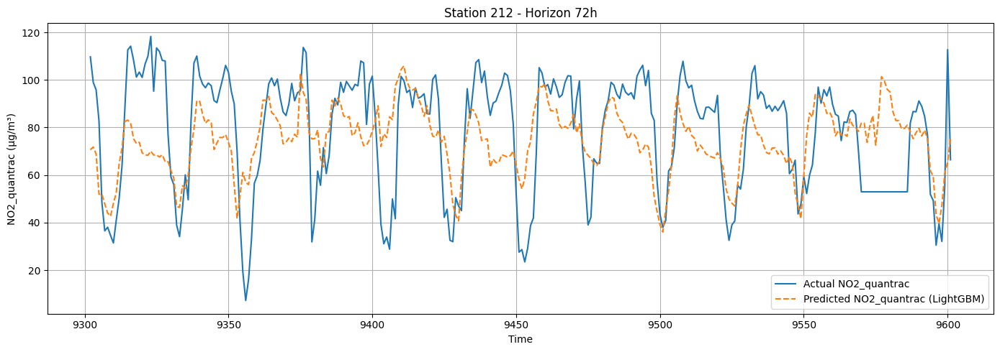

station_id = 213
hour = 1


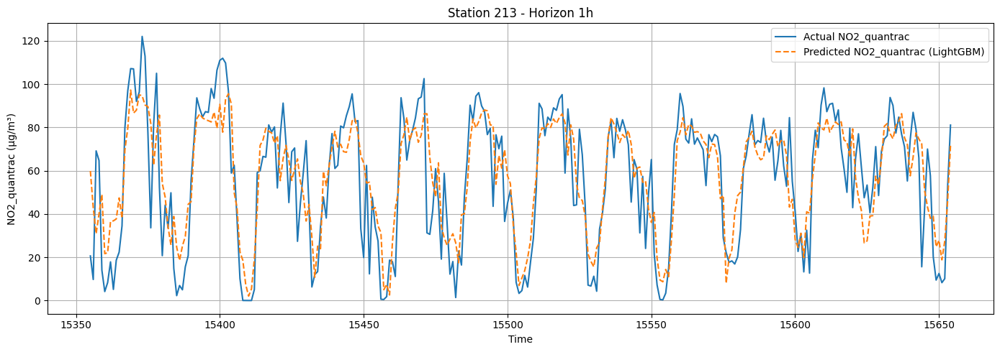

hour = 24


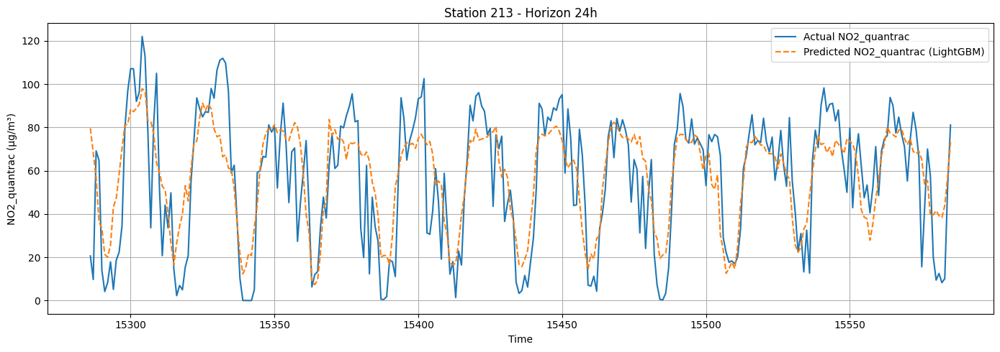

hour = 48


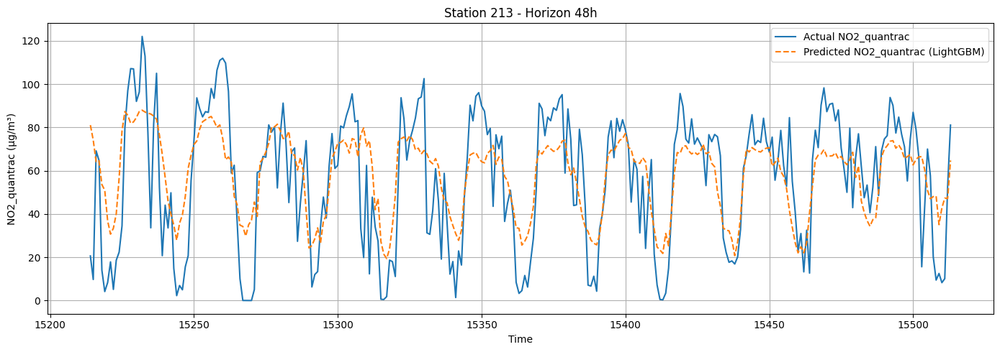

hour = 72


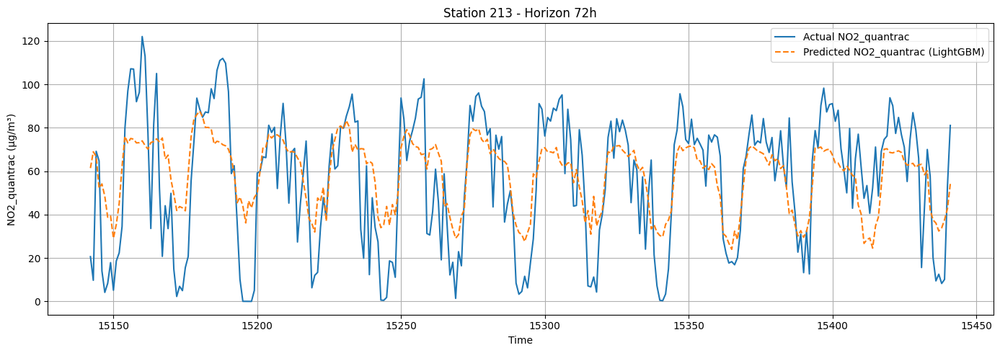

station_id = 214
hour = 1


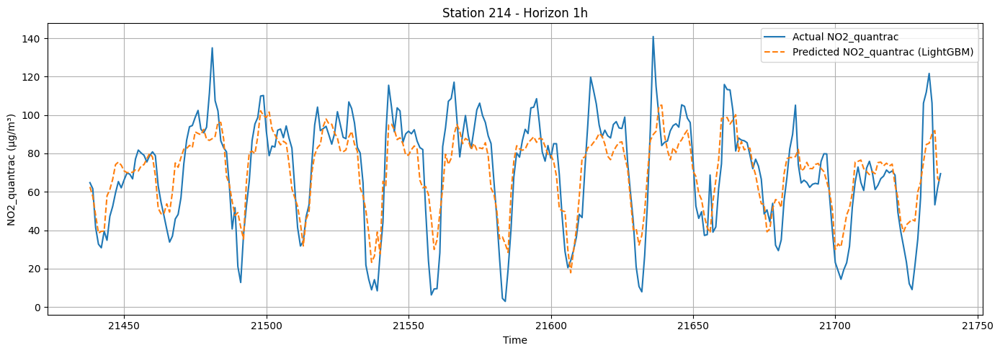

hour = 24


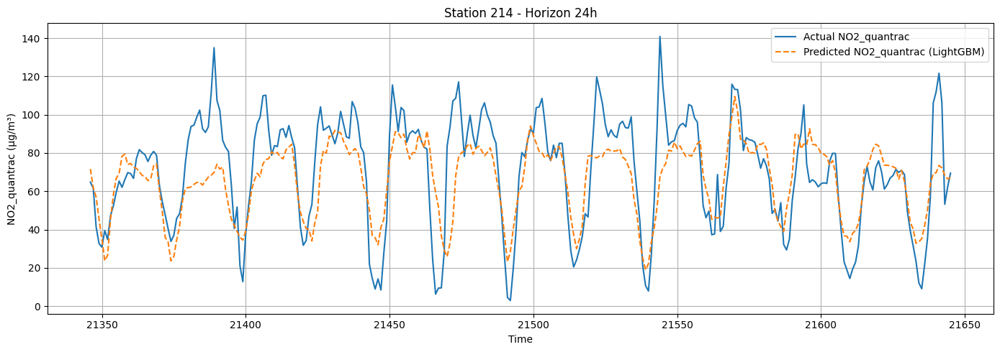

hour = 48


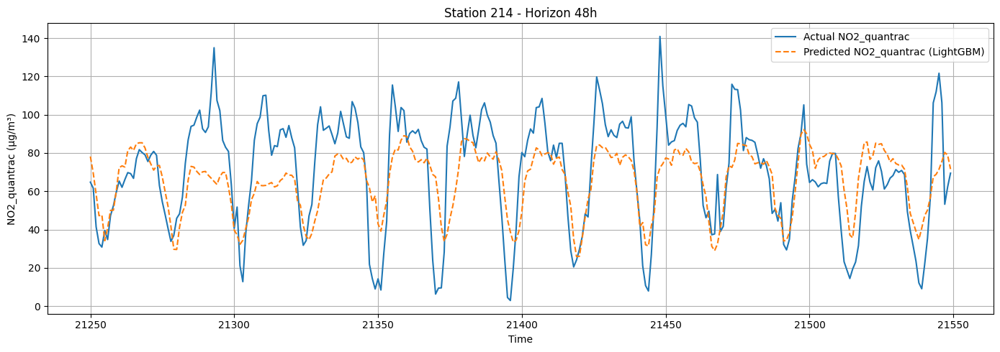

hour = 72


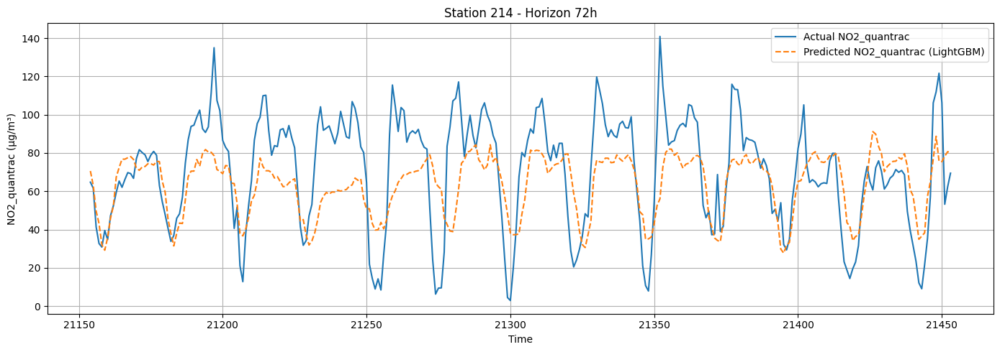

station_id = 215
hour = 1


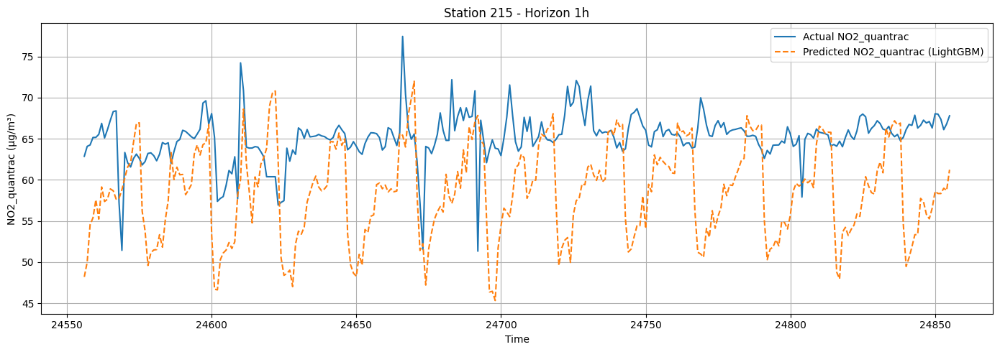

hour = 24


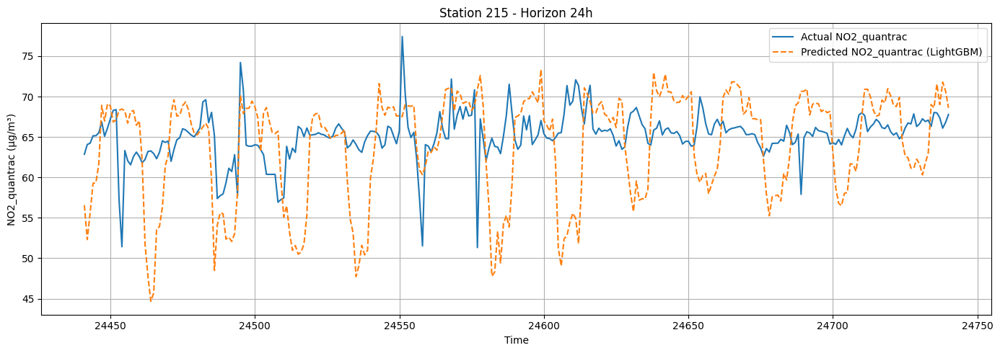

hour = 48


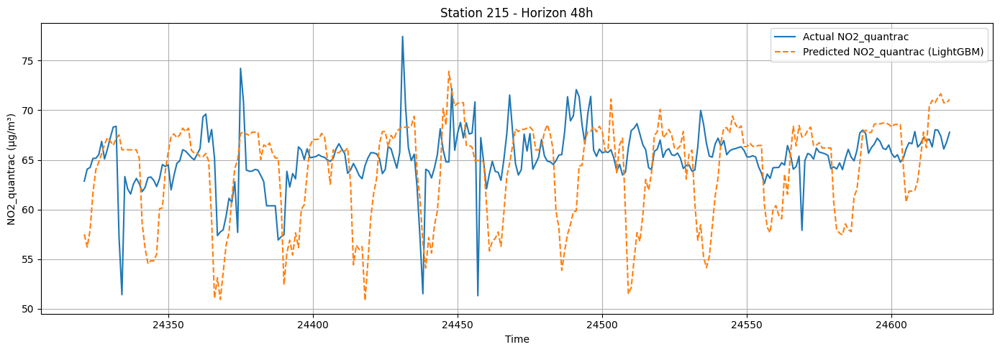

hour = 72


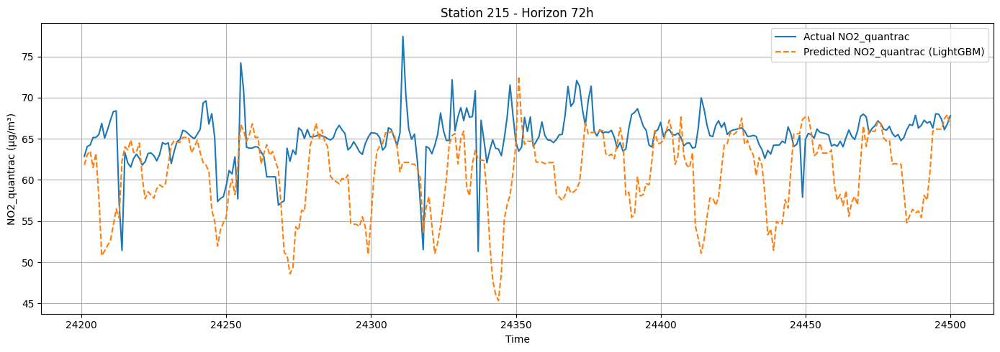

station_id = 216
hour = 1


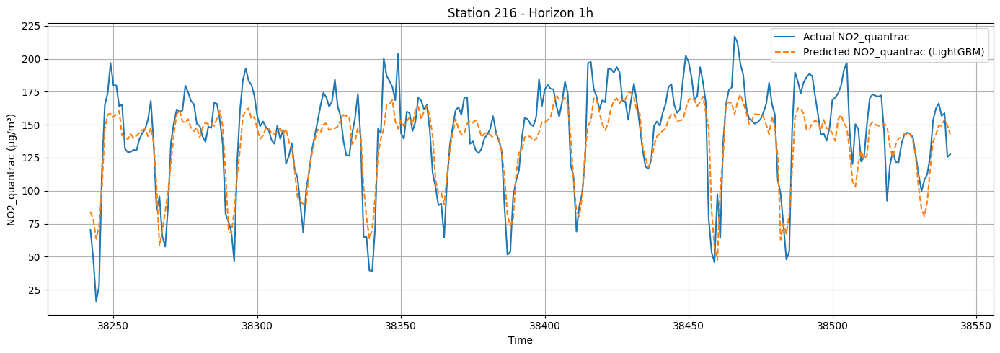

hour = 24


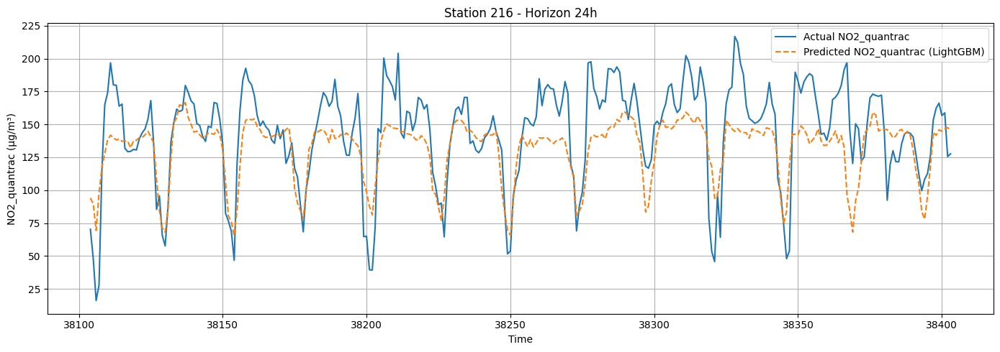

hour = 48


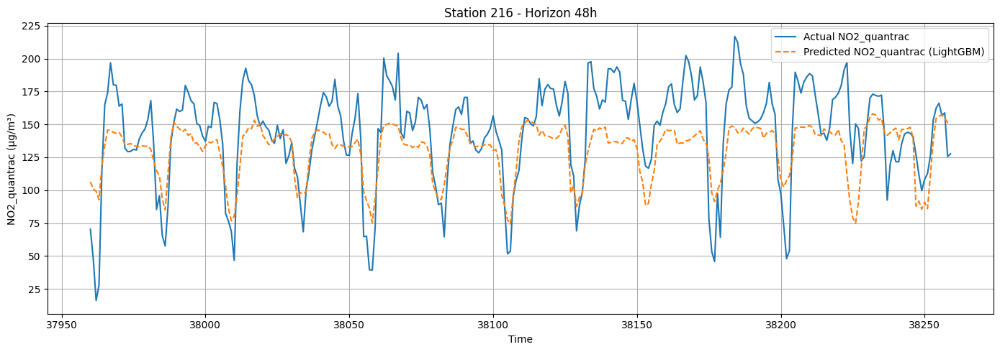

hour = 72


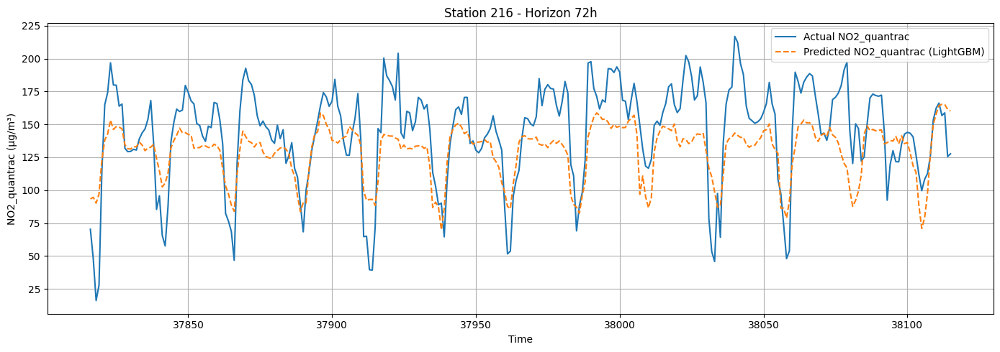

In [20]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in HORIZONS:
        print(f"hour = {hour}")
        plot_timeseries_example(df_no2, no2_models_by_h[hour], horizon_h=hour, station_id=station_id, target_col=label)

## Training for O3

In [21]:
label = "O3_quantrac"

# Add rolling features for LABEL
df_o3 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)
print(df_o3.columns)

# Start running model
o3_all_metrics = []
o3_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_o3, horizon_h=h, target_col=label)
    o3_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    o3_all_metrics.append(metrics_by_station)

o3_df_metrics_all = pd.concat(o3_all_metrics, ignore_index=True)
o3_df_metrics_all = o3_df_metrics_all.sort_values(["station", "horizon_h"])
o3_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"))
o3_df_metrics_all

Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id', 'hour',
       'dayofweek', 'month', 'NO2_quantrac_lag3', 'NO2_quantrac_lag6',
       'NO2_quantrac_lag12', 'NO2_quantrac_lag24', 'PM25_quantrac_lag3',
       'PM25_quantrac_lag6', 'PM25_quantrac_lag12', 'PM25_quantrac_lag24',
       'O3_quantrac_lag3', 'O3_quantrac_lag6', 'O3_quantrac_lag12',
       'O3_quantrac_lag24', 'CO_quantrac_lag3', 'CO_quantrac_lag6',
       'CO_quantrac_lag12', 'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'O3_quantrac_roll3_mean', 'O3_quantrac_roll3_std',
       'O3_quantrac_roll6_mean', 'O3_quantrac_roll6_std',
       'O3_quantrac_roll12_mean', 'O3_quantrac_roll12_std',
       'O3_quantrac_roll24_mean', 'O3_

,station,horizon_h,RMSE,MAE,MBE,MNBE,r,n_samples
0,211,1,13.065396,10.974465,0.525208,7.445612,0.788084,588
6,211,24,14.988498,13.234398,0.928820,10.880388,0.744603,585
12,211,48,16.085526,14.183259,2.704458,15.539793,0.764072,581
18,211,72,17.528717,14.993604,-2.496303,6.549872,0.662259,577
1,212,1,27.291135,20.116839,-1.502862,2.994552,0.351219,875
7,212,24,29.294652,23.400828,-9.049344,-3.091175,0.214125,871
13,212,48,28.784981,23.283577,-8.119997,-2.180728,0.223183,867
19,212,72,32.046517,25.451833,-16.047461,-9.298354,0.182238,864
2,213,1,26.998331,21.285934,1.081832,45.193665,0.632590,887
8,213,24,30.825833,24.707784,1.306436,54.700110,0.467664,884


station_id = 211
hour = 1


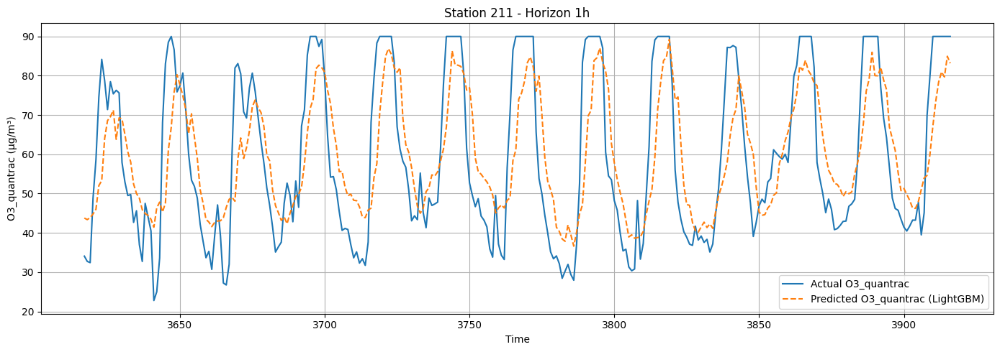

hour = 24


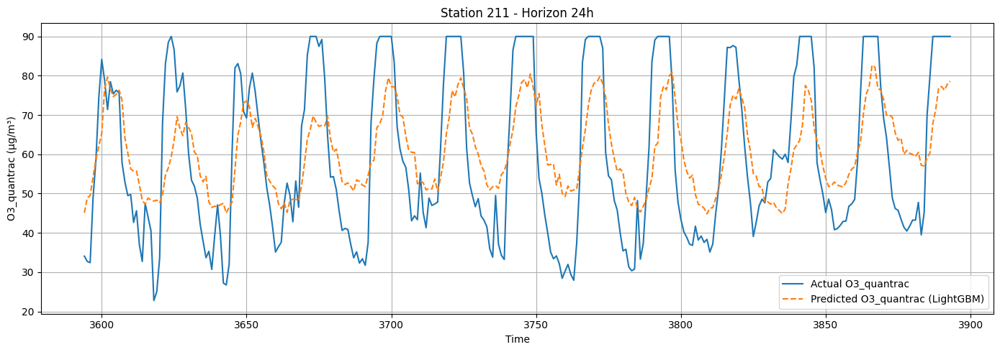

hour = 48


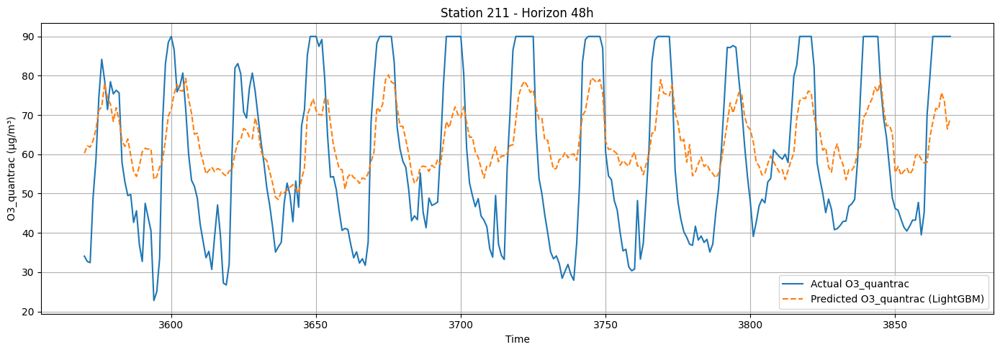

hour = 72


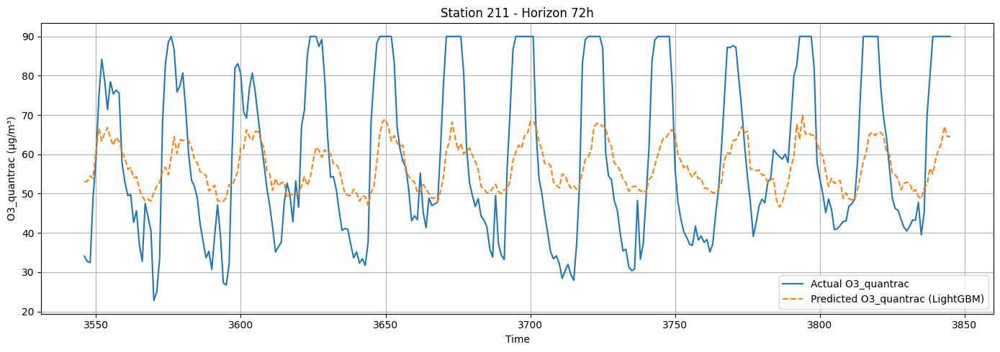

station_id = 212
hour = 1


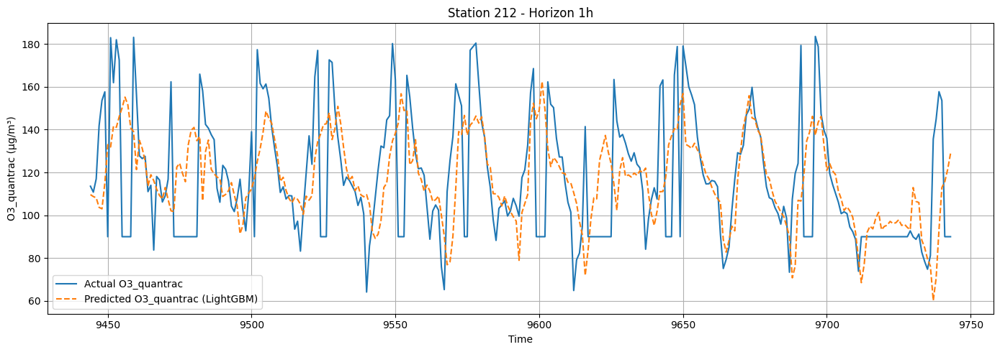

hour = 24


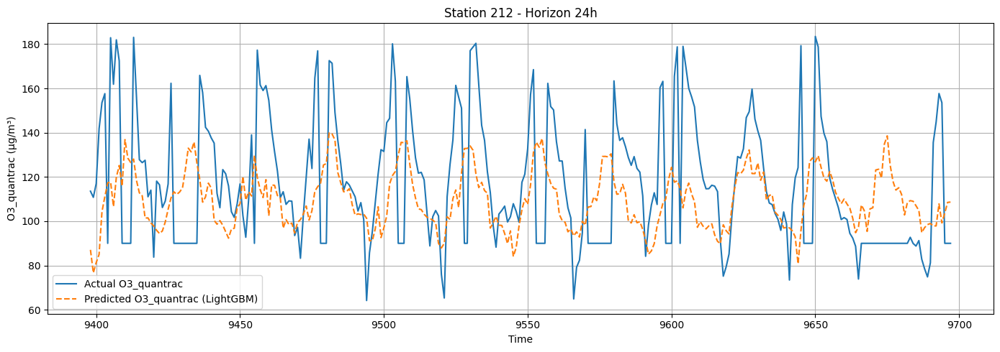

hour = 48


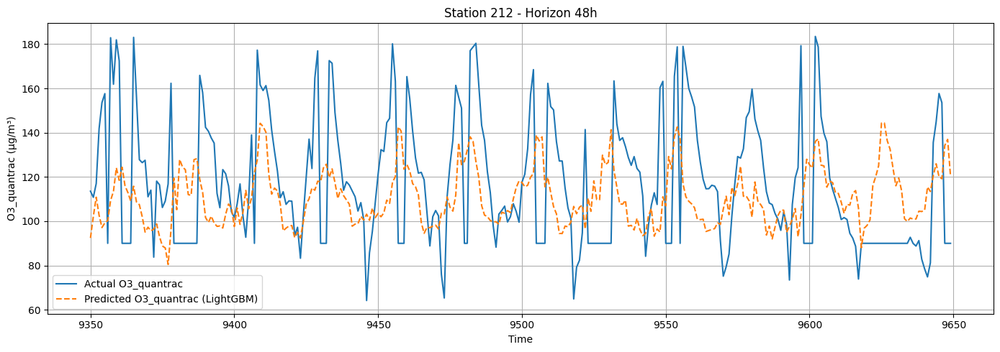

hour = 72


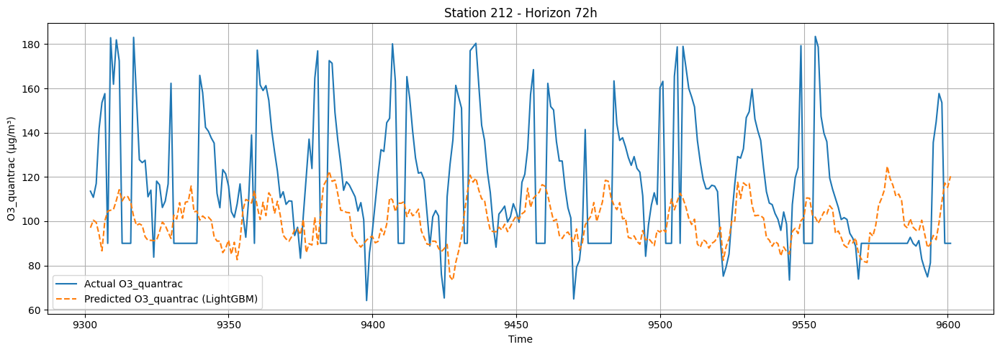

station_id = 213
hour = 1


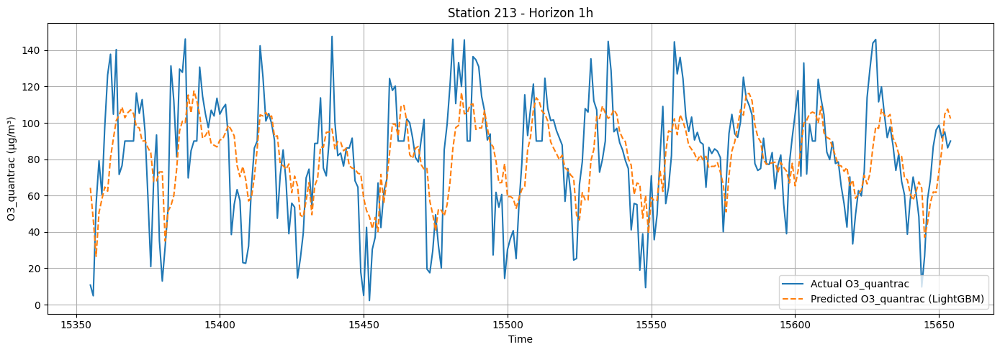

hour = 24


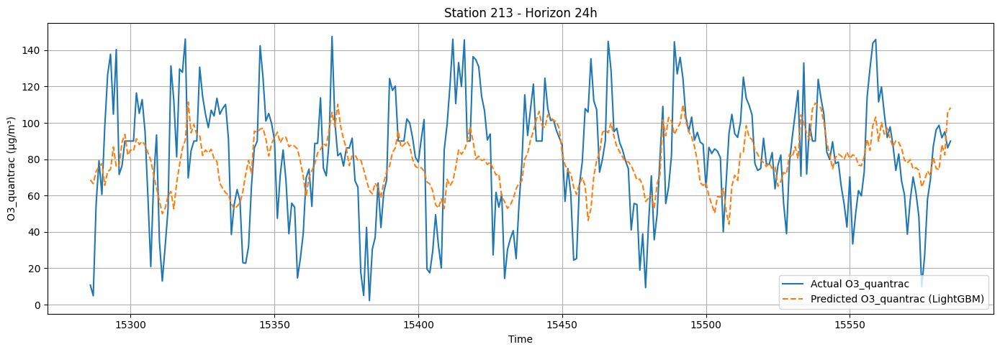

hour = 48


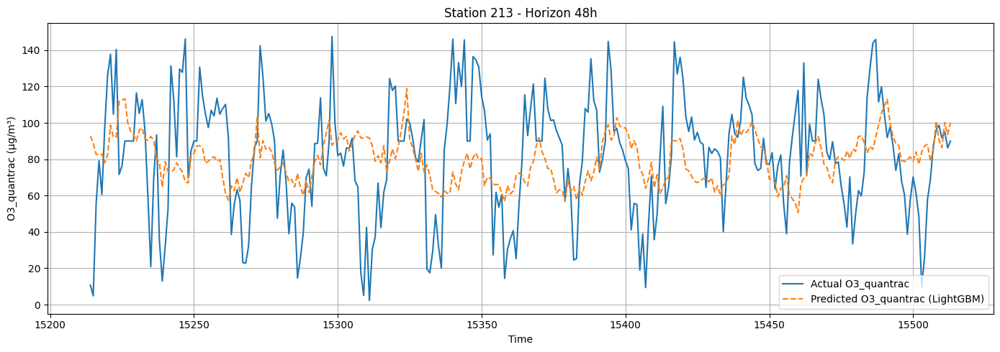

hour = 72


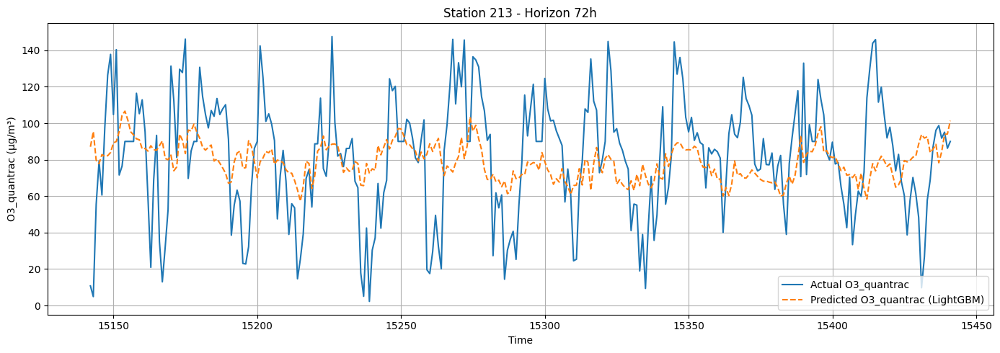

station_id = 214
hour = 1


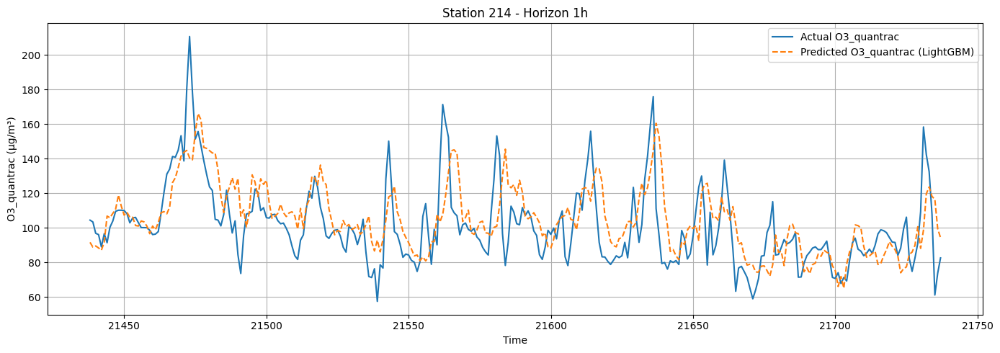

hour = 24


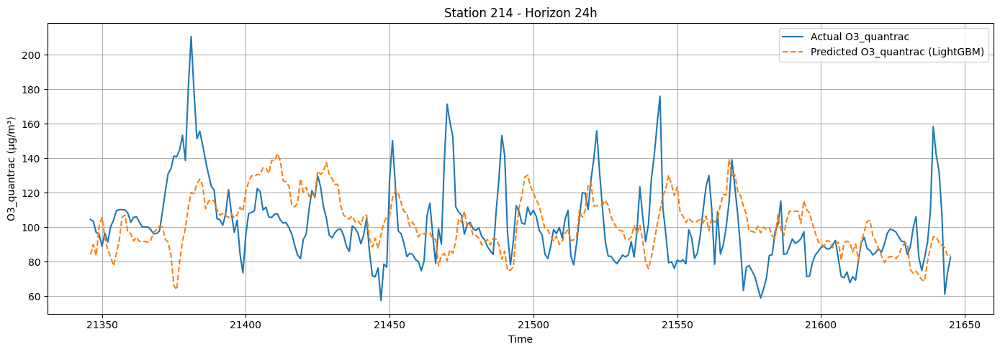

hour = 48


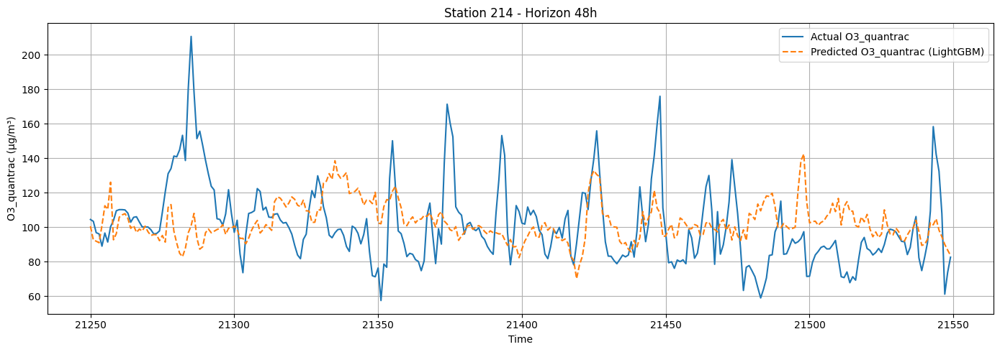

hour = 72


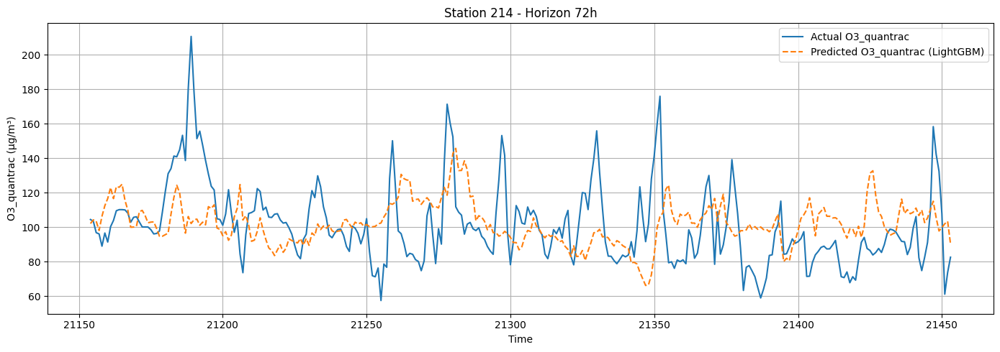

station_id = 215
hour = 1


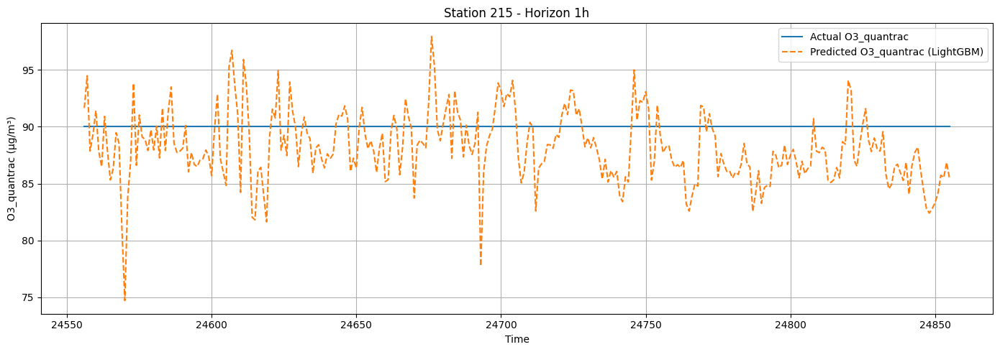

hour = 24


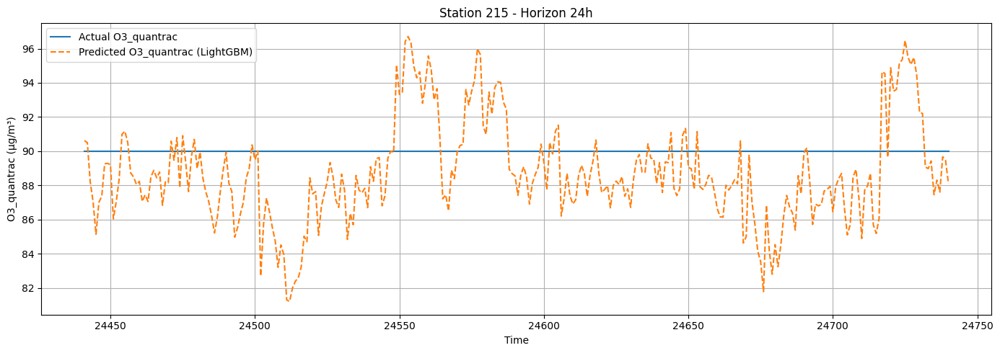

hour = 48


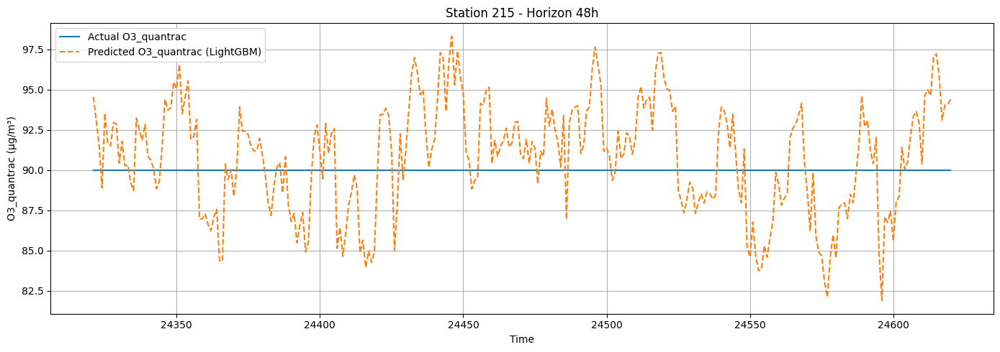

hour = 72


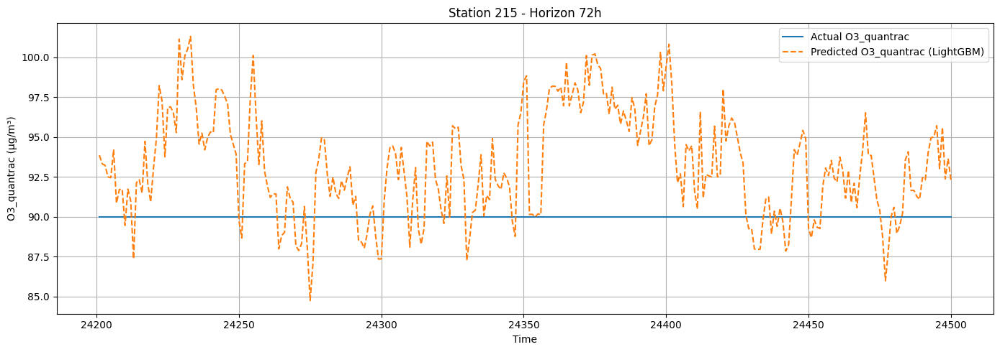

station_id = 216
hour = 1


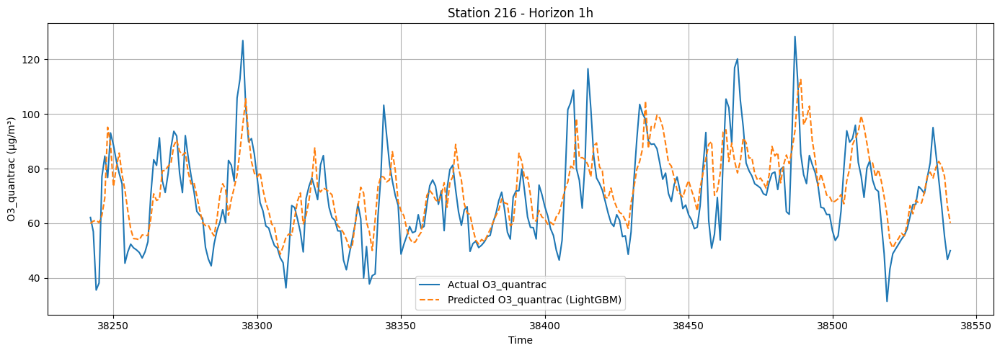

hour = 24


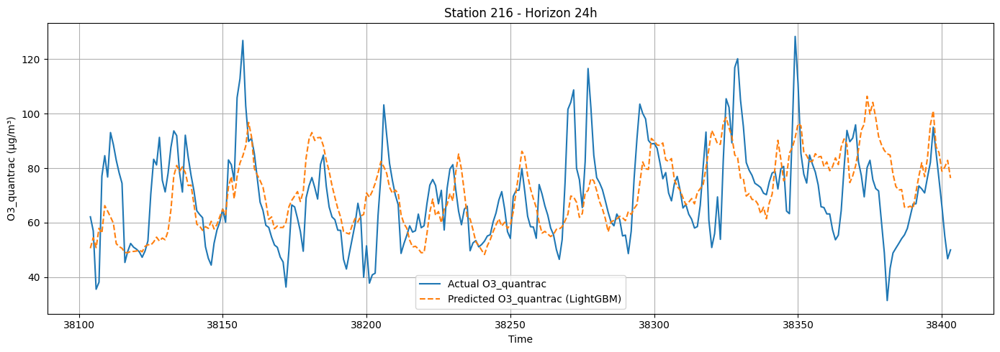

hour = 48


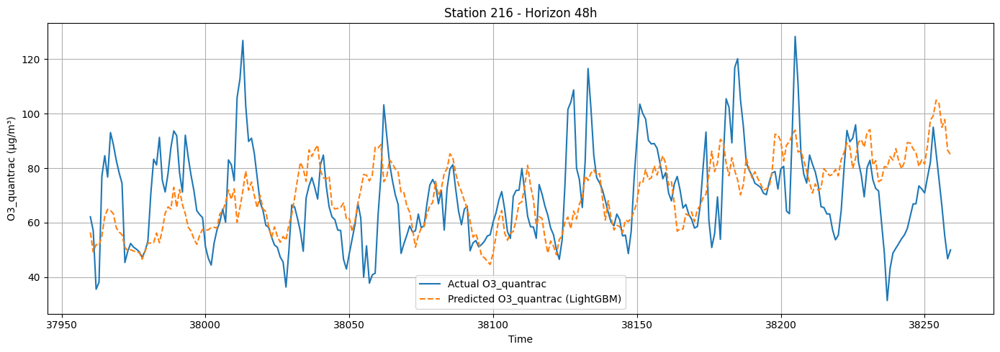

hour = 72


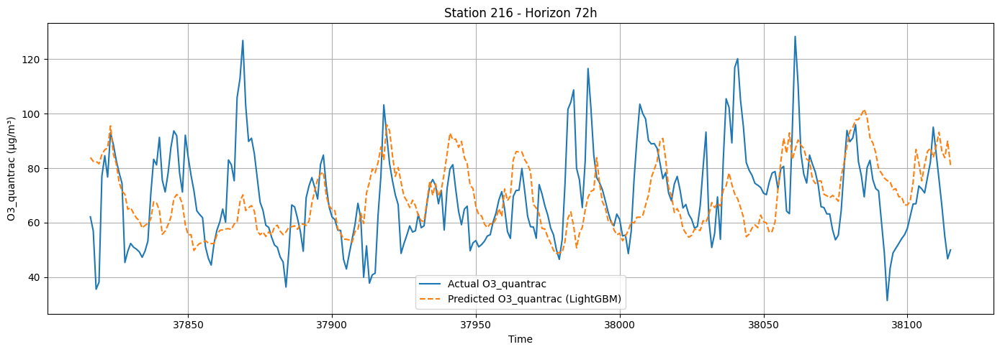

In [22]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_o3, o3_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label)

## Training for CO

In [23]:
label = "CO_quantrac"

# Add rolling features for LABEL
df_co = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)
print(df_co.columns)

# Start running model
co_all_metrics = []
co_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_co, horizon_h=h, target_col=label)
    co_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    co_all_metrics.append(metrics_by_station)

co_df_metrics_all = pd.concat(co_all_metrics, ignore_index=True)
co_df_metrics_all = co_df_metrics_all.sort_values(["station", "horizon_h"])
co_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"))
co_df_metrics_all

Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id', 'hour',
       'dayofweek', 'month', 'NO2_quantrac_lag3', 'NO2_quantrac_lag6',
       'NO2_quantrac_lag12', 'NO2_quantrac_lag24', 'PM25_quantrac_lag3',
       'PM25_quantrac_lag6', 'PM25_quantrac_lag12', 'PM25_quantrac_lag24',
       'O3_quantrac_lag3', 'O3_quantrac_lag6', 'O3_quantrac_lag12',
       'O3_quantrac_lag24', 'CO_quantrac_lag3', 'CO_quantrac_lag6',
       'CO_quantrac_lag12', 'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'CO_quantrac_roll3_mean', 'CO_quantrac_roll3_std',
       'CO_quantrac_roll6_mean', 'CO_quantrac_roll6_std',
       'CO_quantrac_roll12_mean', 'CO_quantrac_roll12_std',
       'CO_quantrac_roll24_mean', 'CO_

,station,horizon_h,RMSE,MAE,MBE,MNBE,r,n_samples
0,211,1,52.486601,42.658459,-24.738743,-3.312164,0.548422,588
6,211,24,66.732280,50.934415,16.263906,2.337968,0.075879,585
12,211,48,61.860931,47.748137,36.102223,5.004486,0.105511,581
18,211,72,138.122142,119.164674,116.911789,15.772131,0.245870,577
1,212,1,32.349709,24.471224,6.797320,2.959194,0.252558,875
7,212,24,123.605188,109.140312,109.112802,120.178256,0.034620,871
13,212,48,138.118253,107.910632,107.910632,114.611194,-0.072917,867
19,212,72,225.251308,175.123701,175.123701,189.668823,-0.032790,864
2,213,1,413.131199,302.286862,-55.274971,45.908235,0.457633,887
8,213,24,484.527457,355.347090,-83.141370,44.987344,0.174938,884


station_id = 211
hour = 1


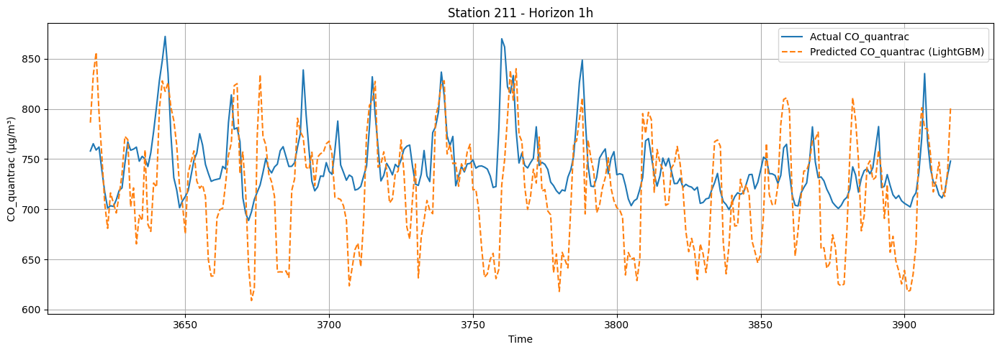

hour = 24


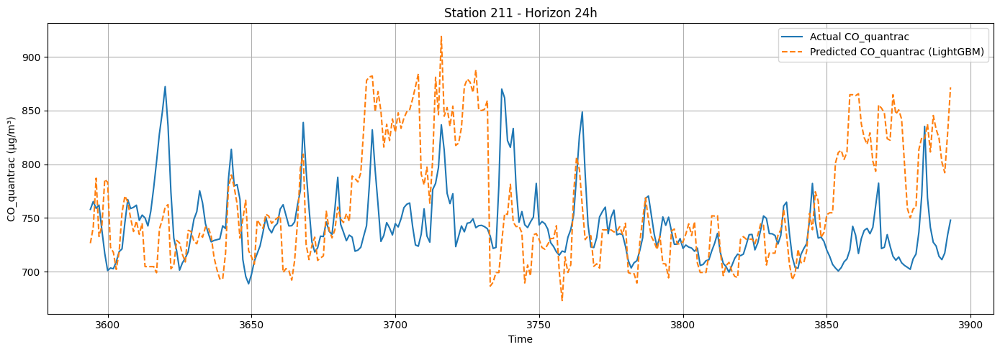

hour = 48


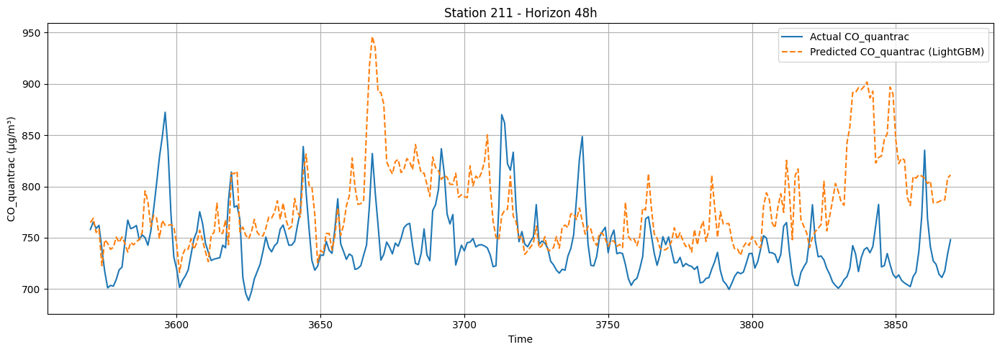

hour = 72


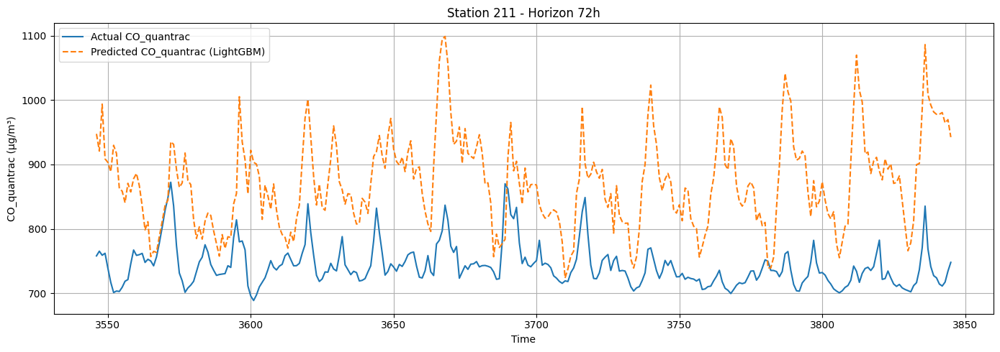

station_id = 212
hour = 1


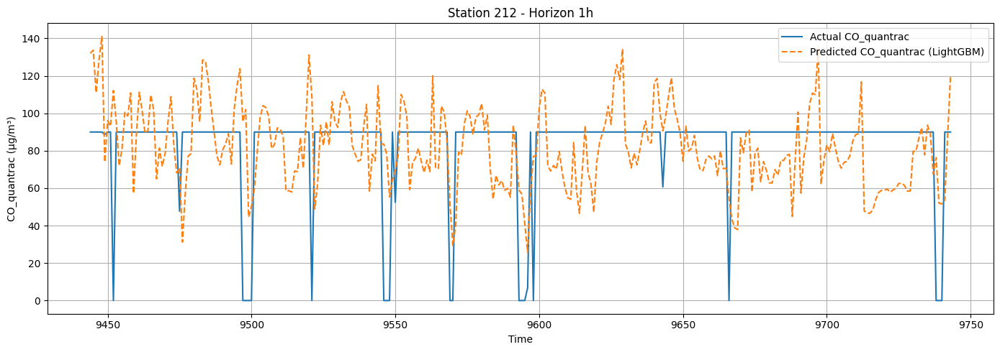

hour = 24


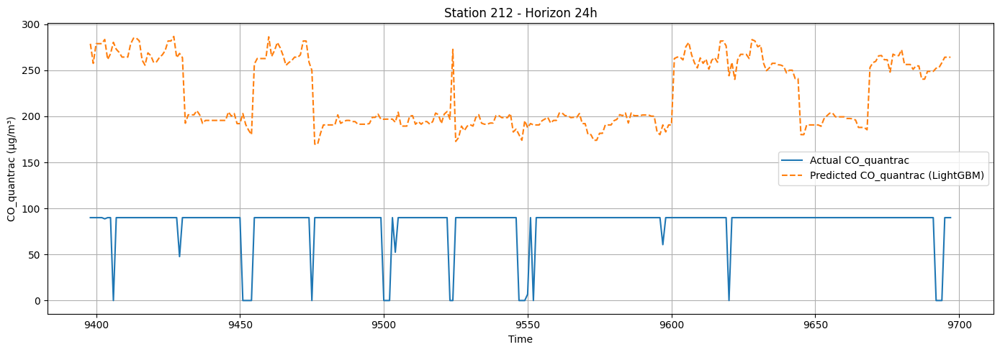

hour = 48


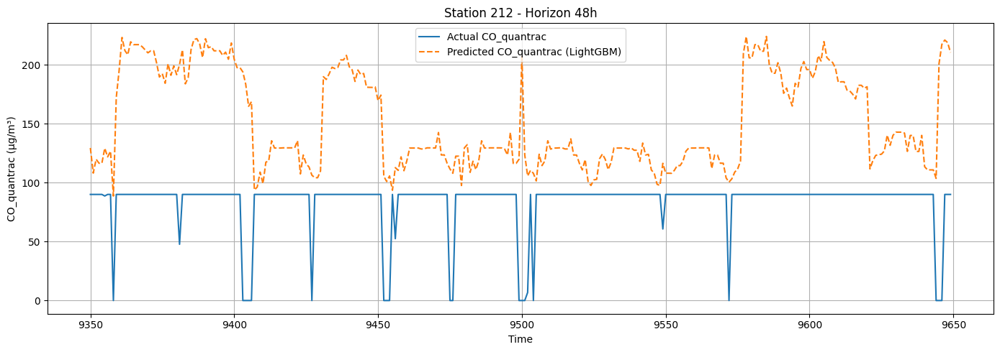

hour = 72


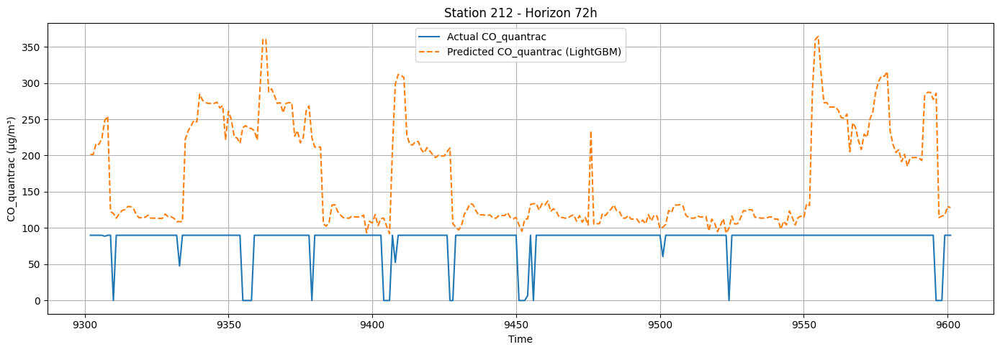

station_id = 213
hour = 1


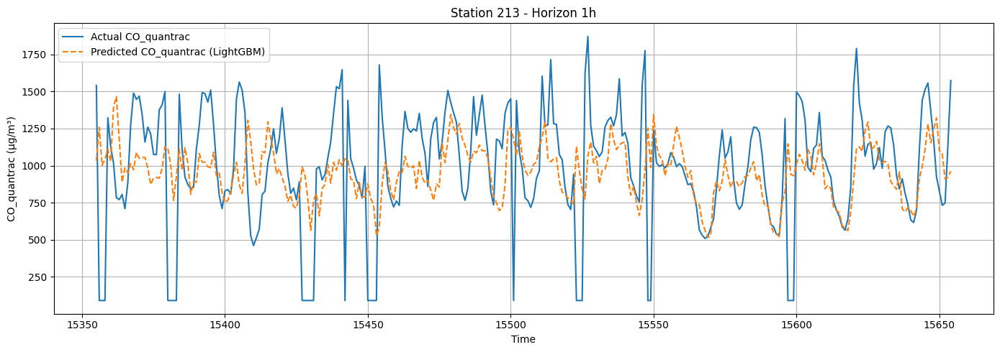

hour = 24


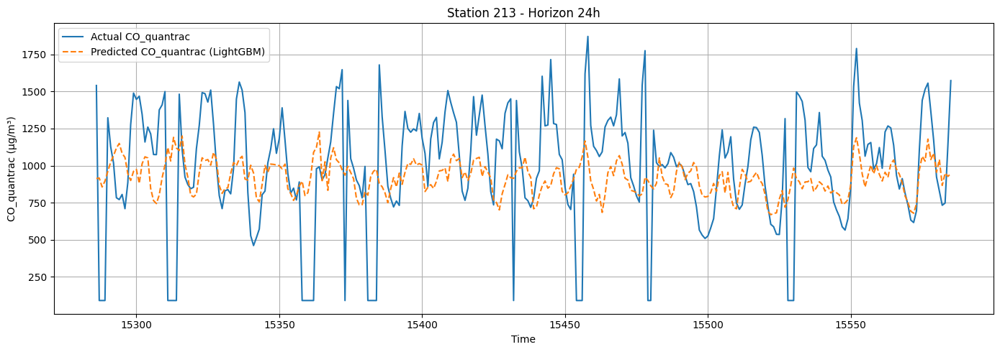

hour = 48


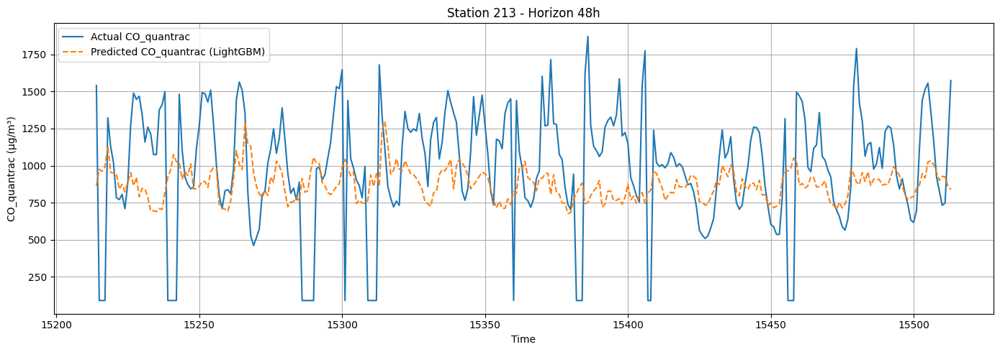

hour = 72


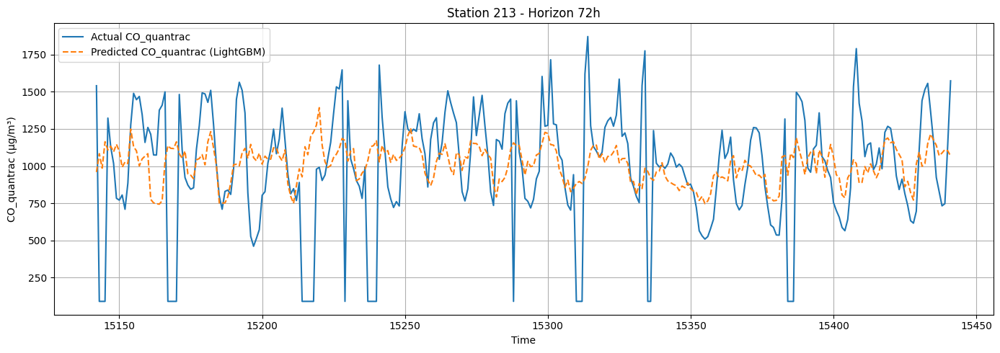

station_id = 214
hour = 1


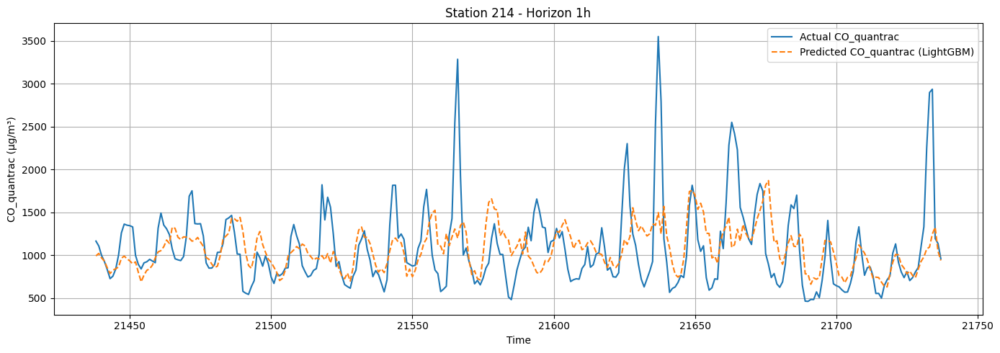

hour = 24


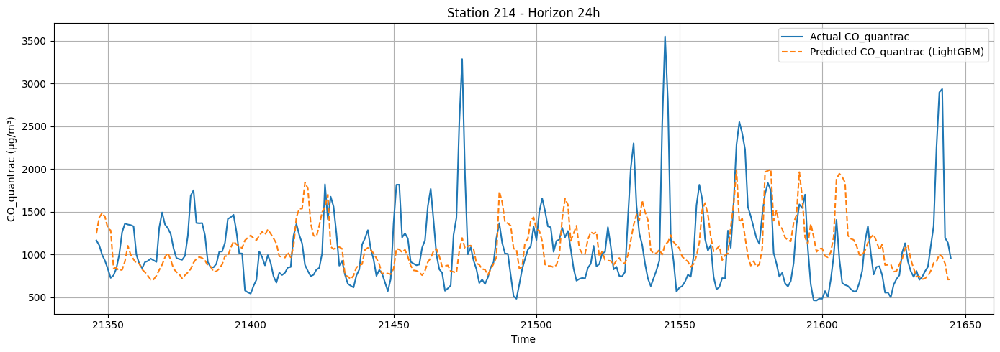

hour = 48


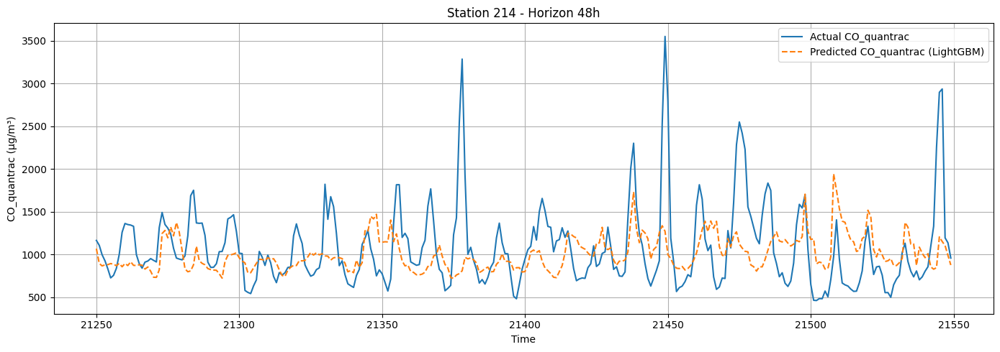

hour = 72


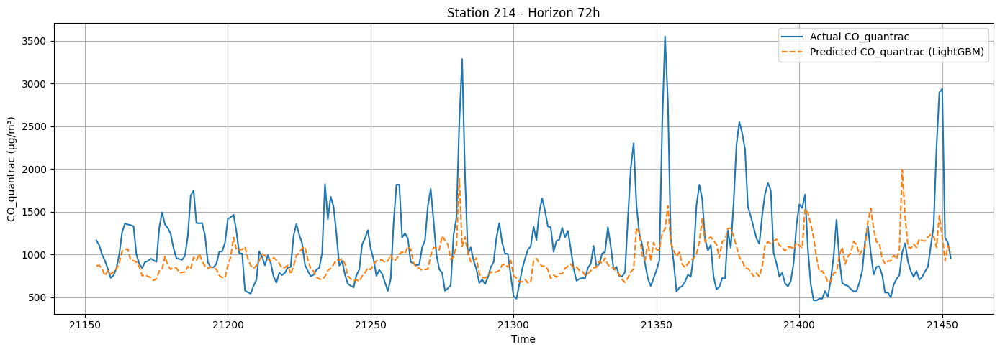

station_id = 215
hour = 1


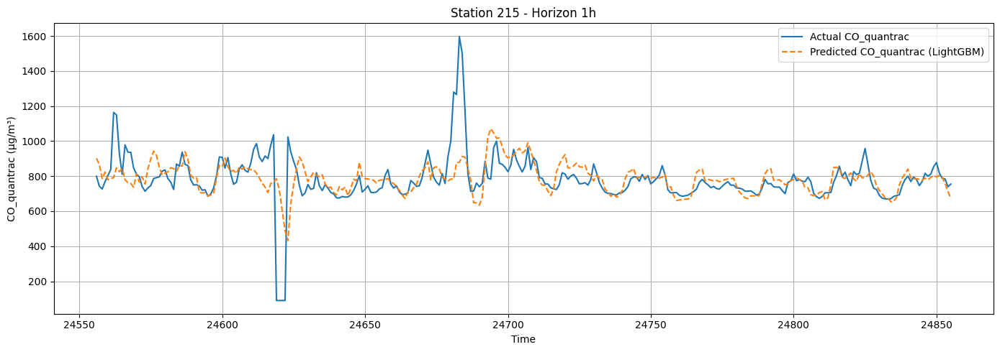

hour = 24


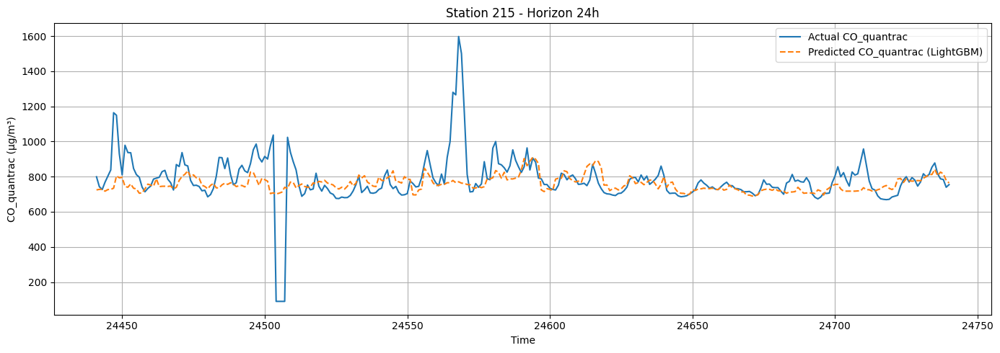

hour = 48


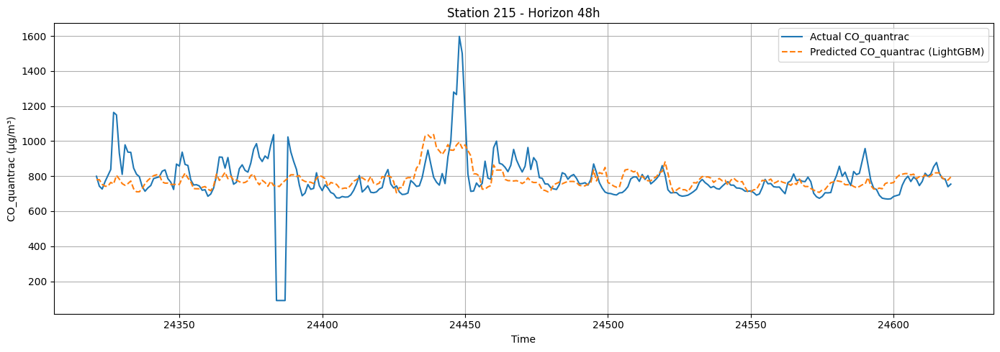

hour = 72


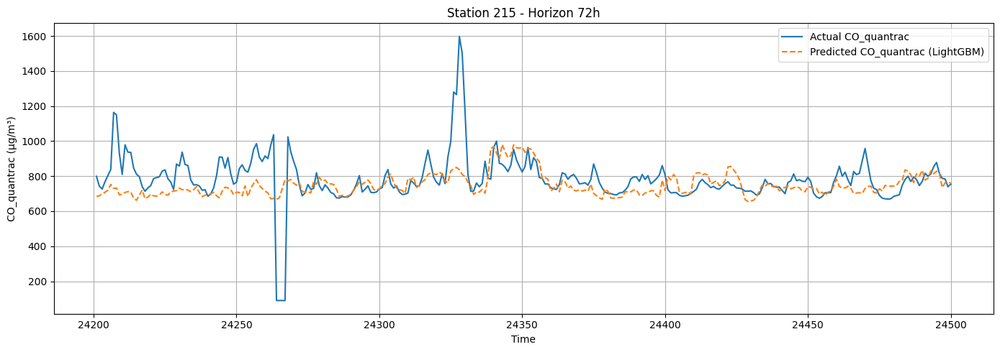

station_id = 216
hour = 1


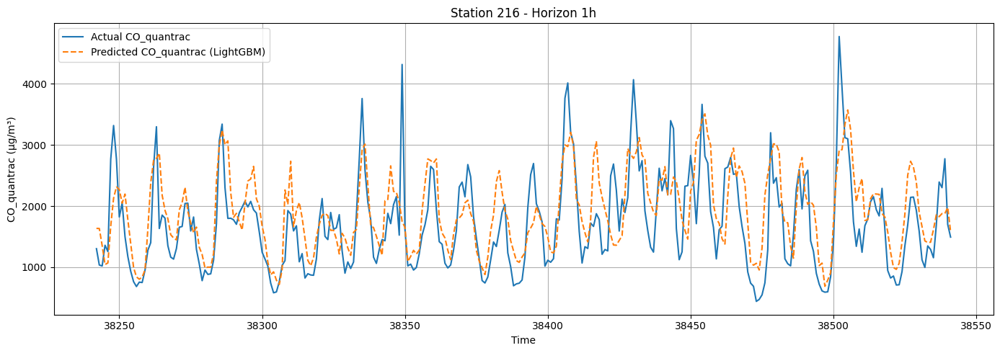

hour = 24


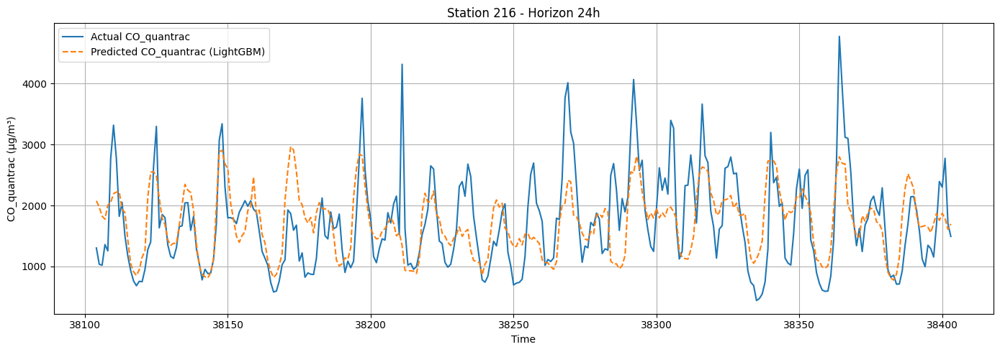

hour = 48


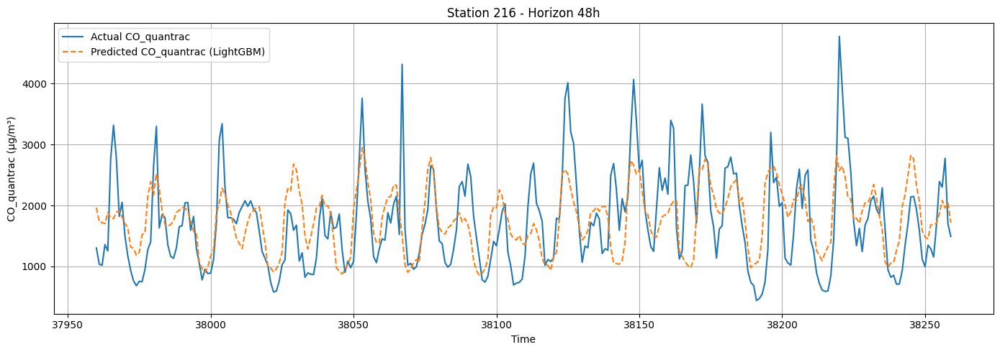

hour = 72


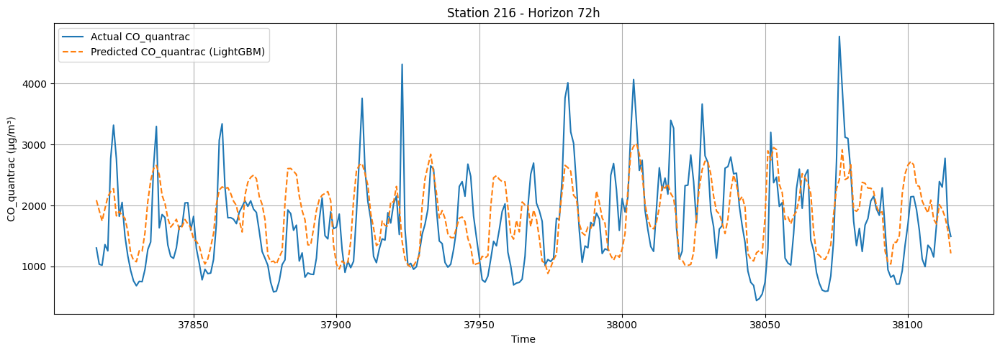

In [24]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_co, co_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label)